In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
pd.set_option("display.max_columns" , None)
pd.set_option("display.float_format" , lambda x : "%.4f" % x)

In [3]:
from warnings import filterwarnings
import gc

filterwarnings("ignore" , category = DeprecationWarning)
filterwarnings("ignore" , category = FutureWarning)
filterwarnings("ignore")

In [4]:
path = "/Users/gokhanersoz/Desktop/GitHub/Fraud/ieee-fraud-detection"

In [5]:
%%time

# Transaction : İşlem
# İdentity : Kimlik

train_transaction = pd.read_csv(f"{path}/train_transaction.csv")
test_transaction = pd.read_csv(f"{path}/test_transaction.csv")

train_identity = pd.read_csv(f"{path}/train_identity.csv")
test_identity = pd.read_csv(f"{path}/test_identity.csv")

CPU times: user 17.8 s, sys: 2.78 s, total: 20.5 s
Wall time: 20.6 s


In [6]:
print("Train Transcation Shape : {}".format(train_transaction.shape))
print("Train Identity Shape : {}".format(train_identity.shape))
print("\n")
print("Test Transcation Shape : {}".format(test_transaction.shape))
print("Test Identity Shape : {}".format(test_identity.shape))

Train Transcation Shape : (590540, 394)
Train Identity Shape : (144233, 41)


Test Transcation Shape : (506691, 393)
Test Identity Shape : (141907, 41)


In [7]:
%%time

train = pd.merge(left = train_transaction,
                 right = train_identity,
                 on = "TransactionID", 
                 how = "left")

test = pd.merge(left = test_transaction,
                right = test_identity,
                on = "TransactionID",
                how = "left")

del train_transaction,train_identity, test_transaction, test_identity
gc.collect()

CPU times: user 5.24 s, sys: 5.72 s, total: 11 s
Wall time: 11.5 s


0

In [8]:
print("Train Shape : {}".format(train.shape))
print("Test Shape : {}".format(test.shape))

Train Shape : (590540, 434)
Test Shape : (506691, 433)


In [9]:
train.tail(3)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
590537,3577537,0,15811079,30.9500,W,12037,595.0000,150.0000,mastercard,224.0000,debit,231.0000,87.0000,NaN,NaN,gmail.com,NaN,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,1.0000,0.0000,NaN,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,NaN,NaN,0.0000,T,F,F,NaN,NaN,T,NaN,NaN,NaN,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.0000,0.0000,1.0000,1.0000,0.00

In [10]:
test.head(3)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.9500,W,10409,111.0000,150.0000,visa,226.0000,debit,170.0000,87.0000,1.0000,NaN,gmail.com,NaN,6.0000,6.0000,0.0000,0.0000,3.0000,4.0000,0.0000,0.0000,6.0000,0.0000,5.0000,1.0000,115.0000,6.0000,419.0000,419.0000,27.0000,398.0000,27.0000,NaN,NaN,NaN,NaN,418.0000,203.0000,NaN,NaN,NaN,409.0000,T,T,F,NaN,NaN,F,T,T,T,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,47.9500,0.0000,0.0000,47.9500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.0000,0.0000,0.0000,0.0000,0

##  EDA

**reference** : https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203

**

``TranscationDT``:

Belirli bir referans tarih saatinden Timedelta (Gerçek bir zaman damgası değil !!!!)

“ TransactionDT ilk değeri 86400 yani bir gün içindeki saniye sayısına (60 * 60 * 24=86400) tekabül ediyor yani birimi saniye sanıyorum. Bunu kullanarak, maksimum değerin 183. güne karşılık gelen 15811131 olduğu için verilerin 6 ayı kapsadığını biliyoruz. ”

``TranscationAmt``:

USD cinsinden işlem ödeme tutarı

“ Bazı işlem tutarlarında, ondalık noktanın sağında üç ondalık basamak bulunur. Üç ondalık basamağa ve boş bir addr1 ve addr2 alanına bir bağlantı var gibi görünüyor. Bunların yabancı işlemler olması ve örneğin 12. satırdaki 75.887'nin bir döviz tutarının bir döviz kuru ile çarpılmasının sonucu olması mümkün müdür? ”

``dist``:

Mesafe

" Fatura Adresi, Posta Adresi, Posta Kodu, Ip Adresi, Telefon Alanı Vb. Arasındaki (Sınırlı Olmayan) Mesafeler. "


``C1-C14``:

Ödeme Kartıyla Kaç Adresin Ilişkilendirildiği Gibi Sayma Vb. Gerçek Anlam Maskelenir.

“ C1-15 değişkenlerinde daha fazla sayı örneği verebilir misiniz? Bunlar, kullanıcıyla ilişkili telefon numaraları, e-posta adresleri, adlar gibi mi? 15'i düşünemiyorum. ”

" Tahmininiz iyi, ayrıca cihaz, ipaddr, billingaddr vb. gibi. Bunlar hem alıcı hem de alıcı içindir, bu da sayıyı ikiye katlar. ”

``D1-D15``:

Önceki Işlem Arasındaki Günler Vb. Gibi Zaman Deltası

``V1-V339``:

Vesta, sıralama, sayma ve diğer varlık ilişkileri dahil olmak üzere zengin özellikler tasarladı.

"Örneğin, bir IP ve e-posta veya adresle ilişkili ödeme kartının 24 saatlik zaman aralığında kaç kez göründüğü vb."

"Tüm Vesta özellikleri sayısal olarak türetilmiştir. Bazıları bir kümeleme, bir zaman aralığı veya koşul içindeki siparişlerin sayısıdır, bu nedenle değer sonludur ve sıralamaya (veya sıralamaya) sahiptir. Hiçbirini ele almanızı tavsiye etmem. kategorik olarak. Bunlardan herhangi biri şans eseri ikili ile sonuçlandıysa, denemeye değer olabilir."


**

``ProductCD``: 

Ürün Kodu, Her Işlem Için Ürün

“Ürünün gerçek bir 'ürün' olması gerekmez (alışveriş sepetine eklenecek bir ürün gibi). Her türlü hizmet olabilir.”

``card1 - card6``: 

Kart Türü, Kart Kategorisi, Veren Banka, Ülke Vb. Gibi Ödeme Kartı Bilgileri.

``M1-M9``: 

Karttaki Isimler Ve Adres Vb. Gibi Eşleşme

``addr1-addr2``:

Adres: Adres
Her Iki Adres De Alıcı Içindir;
Faturalandırma Bölgesi Olarak Addr1;
Fatura Ülkesi Olarak Addr2

``P_emaildomain --- R_emaildomain``:

Müşteri ve Alıcı e-posta alanı.

“ Belirli Işlemlerin Alıcıya Ihtiyacı Yoktur, Bu Nedenle R_Emaildomain Boştur. ”

``DeviceType ; DeviceInfo; id_01 - id_11; id_12 - id_38``:

Bu tablodaki değişkenler, işlemlerle ilişkili kimlik bilgileri – ağ bağlantı bilgileri (IP, ISP, Proxy, vb.) ve dijital imzadır (UA/tarayıcı/os/sürüm, vb.).
Vesta'nın dolandırıcılık koruma sistemi ve dijital güvenlik ortakları tarafından toplanırlar.
(Alan adları maskelenmiştir ve gizlilik koruması ve sözleşme sözleşmesi için ikili sözlük sağlanmayacaktır)

“id01 ila id11, cihaz derecelendirmesi, ip_domain derecelendirmesi, proxy derecelendirmesi vb. gibi Vesta ve güvenlik ortakları tarafından toplanan kimlik için sayısal özelliklerdir. Ayrıca, hesap oturum açma süreleri/giriş başarısızlığı süreleri, bir hesabın ne kadar süreceği gibi davranışsal parmak izlerini de kaydetti. sayfada kaldı, vb. Güvenlik ortağı T&C nedeniyle bunların tümü ayrıntılandırılamıyor. Umarım bu özelliklerin temel anlamını kavrarsınız ve sayısal/kategorik olarak bahsederek uygunsuz bir şekilde işlemezsiniz.”

In [11]:
def summary(dataframe):
    
    data = pd.DataFrame()
    data["DTYPES"] = dataframe.dtypes
    data["NAME"] = [col for col in dataframe.columns]
    data["NUNIQUE"] = [dataframe[col].nunique() for col in dataframe.columns]
    data["Missing(%)"] = dataframe.isnull().sum() / len(dataframe) * 100
    
    data = data.reset_index()
    data.drop("index" , axis = 1, inplace= True)
    data = data.sort_values(by = "Missing(%)", ascending = False)
    
    return data

In [12]:
%%time

train_summary = summary(train)
test_summary = summary(test)

CPU times: user 7.04 s, sys: 652 ms, total: 7.69 s
Wall time: 7.69 s


In [13]:
train_summary.head()

,DTYPES,NAME,NUNIQUE,Missing(%)
417,float64,id_24,12,99.1962
418,float64,id_25,341,99.1310
400,float64,id_07,84,99.1271
401,float64,id_08,94,99.1271
414,float64,id_21,490,99.1264


In [14]:
test_summary.head()

,DTYPES,NAME,NUNIQUE,Missing(%)
416,float64,id-24,15,99.0645
417,float64,id-25,309,99.0055
418,float64,id-26,94,99.0039
413,float64,id-21,443,99.0016
400,float64,id-08,90,99.0016


In [15]:
def missing_percentage(summary_func):
    
    """
    
    Summary function with using....
    
    """
    
    for i in range(0,100,10):
        
        percentage = summary_func[summary_func["Missing(%)"] > i]["Missing(%)"].count() \
                     / len(summary_func) * 100
        
        percentage = round(percentage, 4)
        
        print(f"Missing Değeri %{i}'Dan Büyük Olanların Değerine Karşılık Data %{percentage} Boştur..")
        

In [16]:
# Train

missing_percentage(train_summary)

Missing Değeri %0'Dan Büyük Olanların Değerine Karşılık Data %95.3917 Boştur..
Missing Değeri %10'Dan Büyük Olanların Değerine Karşılık Data %74.1935 Boştur..
Missing Değeri %20'Dan Büyük Olanların Değerine Karşılık Data %58.0645 Boştur..
Missing Değeri %30'Dan Büyük Olanların Değerine Karşılık Data %53.4562 Boştur..
Missing Değeri %40'Dan Büyük Olanların Değerine Karşılık Data %53.4562 Boştur..
Missing Değeri %50'Dan Büyük Olanların Değerine Karşılık Data %49.3088 Boştur..
Missing Değeri %60'Dan Büyük Olanların Değerine Karşılık Data %47.9263 Boştur..
Missing Değeri %70'Dan Büyük Olanların Değerine Karşılık Data %47.9263 Boştur..
Missing Değeri %80'Dan Büyük Olanların Değerine Karşılık Data %17.0507 Boştur..
Missing Değeri %90'Dan Büyük Olanların Değerine Karşılık Data %2.765 Boştur..


In [17]:
# Test

missing_percentage(test_summary)

Missing Değeri %0'Dan Büyük Olanların Değerine Karşılık Data %88.9145 Boştur..
Missing Değeri %10'Dan Büyük Olanların Değerine Karşılık Data %58.8915 Boştur..
Missing Değeri %20'Dan Büyük Olanların Değerine Karşılık Data %53.8106 Boştur..
Missing Değeri %30'Dan Büyük Olanların Değerine Karşılık Data %53.8106 Boştur..
Missing Değeri %40'Dan Büyük Olanların Değerine Karşılık Data %50.1155 Boştur..
Missing Değeri %50'Dan Büyük Olanların Değerine Karşılık Data %48.4988 Boştur..
Missing Değeri %60'Dan Büyük Olanların Değerine Karşılık Data %48.2679 Boştur..
Missing Değeri %70'Dan Büyük Olanların Değerine Karşılık Data %48.037 Boştur..
Missing Değeri %80'Dan Büyük Olanların Değerine Karşılık Data %16.3972 Boştur..
Missing Değeri %90'Dan Büyük Olanların Değerine Karşılık Data %2.3095 Boştur..


In [18]:
one_train = [col for col in train.columns if train[col].nunique() == 1]
one_test = [col for col in test.columns if test[col].nunique() == 1]

print("Bir Eşsiz Değere Sahip Train İçin : {}".format(one_train))
print("Bir Eşsiz Değere Sahip Test İçin : {}".format(one_test))

Bir Eşsiz Değere Sahip Train İçin : []
Bir Eşsiz Değere Sahip Test İçin : ['V107']


In [19]:
train.drop("V107", axis = 1, inplace = True)
test.drop("V107", axis = 1, inplace = True)

## Hedef Değişkeni

### Hedef değişkeni aşırı dengesiz ve sadece %0.03 kısmı Fraud olarak tanımlanmıştır.

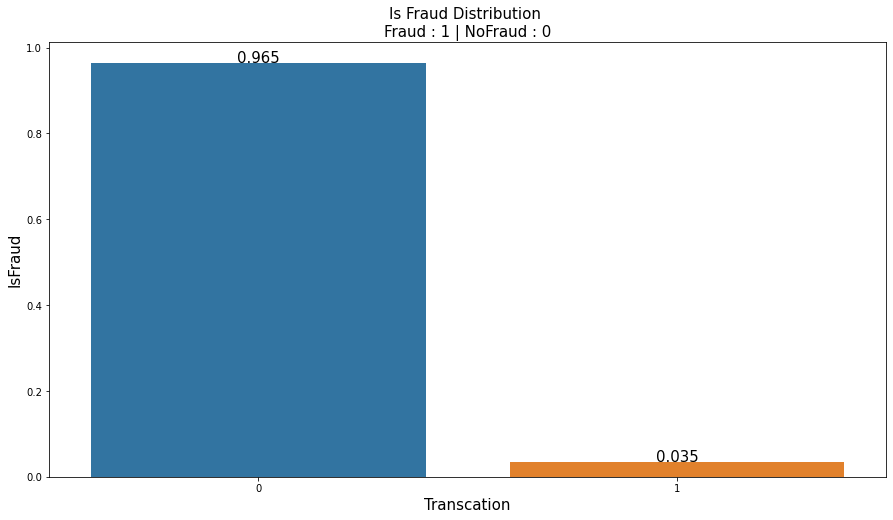

In [20]:
isFraud_percentage = train.isFraud.value_counts() / len(train)
isFraud_Data = pd.DataFrame(isFraud_percentage)
isFraud_Data = isFraud_Data.reset_index()
isFraud_Data.columns = ["Transcation", "IsFraud(%)"]


size = 15
plt.figure(figsize = (15,8))
fraud = sns.barplot(x = "Transcation", y = "IsFraud(%)", data = isFraud_Data)

for index, row in enumerate(isFraud_Data["IsFraud(%)"]):
    
    fraud.text(x = index,y =  row , s = round(row,3), size = size , color = "black", ha = "center")

plt.xlabel("Transcation", fontsize = size)
plt.ylabel("IsFraud", fontsize = size)
plt.title("Is Fraud Distribution \nFraud : 1 | NoFraud : 0", fontsize = size)
plt.show()

# TranscationDT - TimeDelta From a Given Reference DateTime

In [20]:
print("Train TranscationDT Max : {}".format(train["TransactionDT"].max()))
print("Train TranscationDT Min : {}".format(train["TransactionDT"].min()))
print("\n")
print("Test TranscationDT Max : {}".format(test["TransactionDT"].max()))
print("Test TranscationDT Min : {}".format(test["TransactionDT"].min()))

Train TranscationDT Max : 15811131
Train TranscationDT Min : 86400


Test TranscationDT Max : 34214345
Test TranscationDT Min : 18403224


In [21]:
# (60*60*24) -- > 1 Gün
# (60*60) --> 1 Saat

train_span = (train["TransactionDT"].max() - train["TransactionDT"].min()) / (60*60*24)

test_span = (test["TransactionDT"].max() - test["TransactionDT"].min()) / (60*60*24)

total_span = (test["TransactionDT"].max() - train["TransactionDT"].min()) / (60*60*24)

gap_span = (test["TransactionDT"].min() - train["TransactionDT"].max()) / (60*60*24)


print(f"Toplam Veri Setinin Zaman Aralığı {total_span} gündür.\n\n"
      f"Toplam Train Setinin Zaman Aralığı {train_span} gündür.\n\n"
      f"Toplam Test Setinin Zaman Aralığı {test_span} gündür.\n\n"
      f"Toplam Train ile Test Arası Boşluk {gap_span} gündür.\n\n")

Toplam Veri Setinin Zaman Aralığı 394.99936342592594 gündür.

Toplam Train Setinin Zaman Aralığı 181.99920138888888 gündür.

Toplam Test Setinin Zaman Aralığı 182.99908564814814 gündür.

Toplam Train ile Test Arası Boşluk 30.00107638888889 gündür.




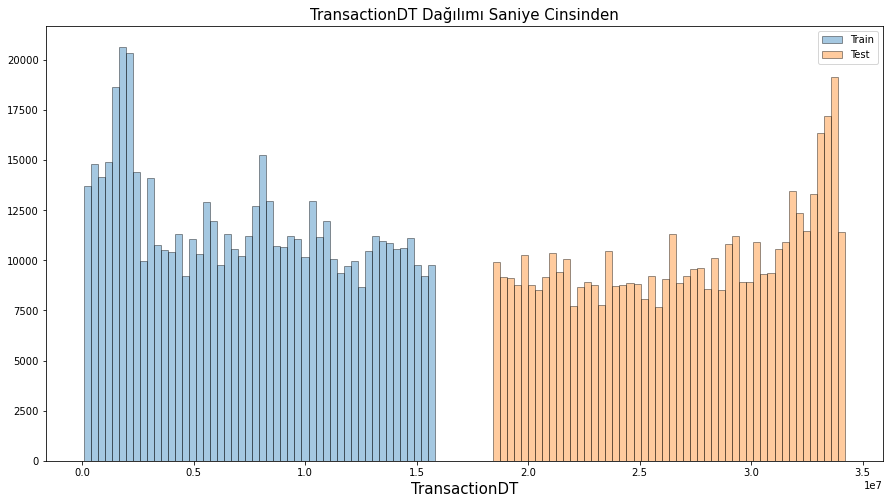

In [23]:
size = 15

plt.figure(figsize = (15,8))
sns.distplot(train["TransactionDT"], kde = False , label = "Train",hist_kws={"edgecolor":"black"})
sns.distplot(test["TransactionDT"],  kde = False , label = "Test", hist_kws={"edgecolor":"black"} )
plt.title("TransactionDT Dağılımı Saniye Cinsinden" , fontsize = size)
plt.xlabel("TransactionDT" , fontsize = size)
plt.legend(loc = "upper right")
plt.show()

## Days

In [24]:
# Bile bile yapıyor - 1 çünkü 0 dan günü başlatırıyorum....!!!!
# Sonra + 1 yapılıyor değişen bişey olmuyor !!

# 5 // 3 = 1 ,
# 5 %  3 = 2 ,
# 5 / 3 = 1.666

In [22]:
for i in range(0,7):
    
    print(f"i : {i}  , {i // 4}")

i : 0  , 0
i : 1  , 0
i : 2  , 0
i : 3  , 0
i : 4  , 1
i : 5  , 1
i : 6  , 1


In [23]:
(((train["TransactionDT"] // (60*60*24) - 1) % 7) ) + 1

0         1
1         1
2         1
3         1
4         1
         ..
590535    7
590536    7
590537    7
590538    7
590539    7
Name: TransactionDT, Length: 590540, dtype: int64

In [24]:
train["days"] = (((train["TransactionDT"] // (60*60*24) -1 ) % 7) + 1) 
test["days"]  = (((test["TransactionDT"] // (60*602*24) -1 ) % 7) + 1)

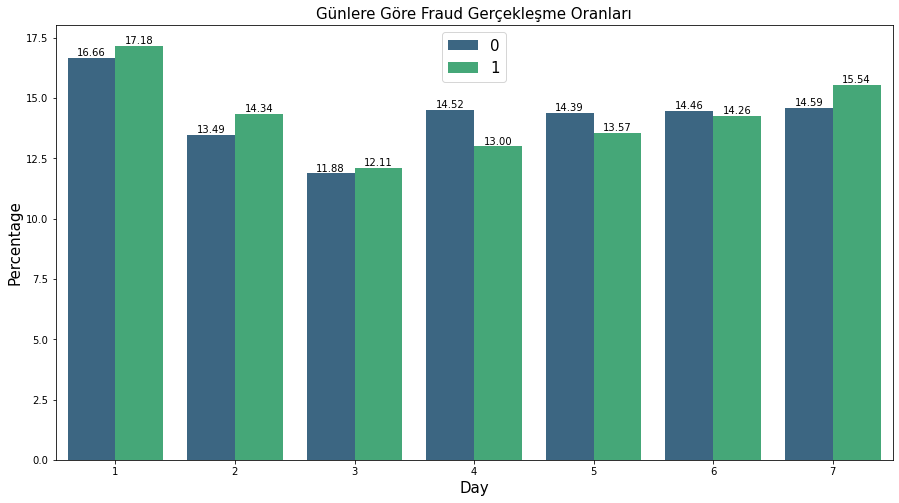

In [25]:
data_day = train.groupby("isFraud")["days"].value_counts(normalize = True).mul(100).rename("percentage").\
           reset_index().sort_values("days")



plt.figure(figsize = (15,8))
data_bar = sns.barplot(x = "days" , y = "percentage", data = data_day, hue = data_day["isFraud"],
                       palette="viridis")

for p in data_bar.patches:
    data_bar.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    
    
size = 15    
plt.xlabel("Day",fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("Günlere Göre Fraud Gerçekleşme Oranları",fontsize = size)
plt.legend(loc = "upper center", fontsize = size)
plt.show()

In [26]:
train.groupby("isFraud")["days"].value_counts(normalize = True).rename("percentage").mul(100).\
reset_index().sort_values("days").T

,0,7,5,9,6,13,2,12,4,11,3,10,1,8
isFraud,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000
days,1.0000,1.0000,2.0000,2.0000,3.0000,3.0000,4.0000,4.0000,5.0000,5.0000,6.0000,6.0000,7.0000,7.0000
percentage,16.6618,17.1805,13.4891,14.3396,11.8833,12.1134,14.5200,13.0039,14.3912,13.5653,14.4610,14.2574,14.5937,15.5399


In [27]:
train.groupby("days")["isFraud"].value_counts(normalize = True).rename("percentage").mul(100).\
reset_index().sort_values("days").T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
days,1.0000,1.0000,2.0000,2.0000,3.0000,3.0000,4.0000,4.0000,5.0000,5.0000,6.0000,6.0000,7.0000,7.0000
isFraud,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000
percentage,96.3960,3.6040,96.2885,3.7115,96.4356,3.5644,96.8548,3.1452,96.6952,3.3048,96.5486,3.4514,96.2826,3.7174


In [28]:
(train.groupby("days")["isFraud"].value_counts() / len(train["days"])).rename("percentage").mul(100).\
reset_index().sort_values("days").T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
days,1.0000,1.0000,2.0000,2.0000,3.0000,3.0000,4.0000,4.0000,5.0000,5.0000,6.0000,6.0000,7.0000,7.0000
isFraud,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000
percentage,16.0788,0.6011,13.0171,0.5017,11.4675,0.4238,14.0119,0.4550,13.8876,0.4747,13.9550,0.4989,14.0830,0.5437


In [29]:
(train.groupby("isFraud")["days"].value_counts() / len(train["days"])).rename("percentage").mul(100).\
reset_index().sort_values("days").T

,0,7,5,9,6,13,2,12,4,11,3,10,1,8
isFraud,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000
days,1.0000,1.0000,2.0000,2.0000,3.0000,3.0000,4.0000,4.0000,5.0000,5.0000,6.0000,6.0000,7.0000,7.0000
percentage,16.0788,0.6011,13.0171,0.5017,11.4675,0.4238,14.0119,0.4550,13.8876,0.4747,13.9550,0.4989,14.0830,0.5437


In [30]:
sum(train["days"] == 2), 2963 / (2963 + 76871)

(79834, 0.03711451261367337)

In [31]:
train[train["days"] == 2]["isFraud"].value_counts()

0    76871
1     2963
Name: isFraud, dtype: int64

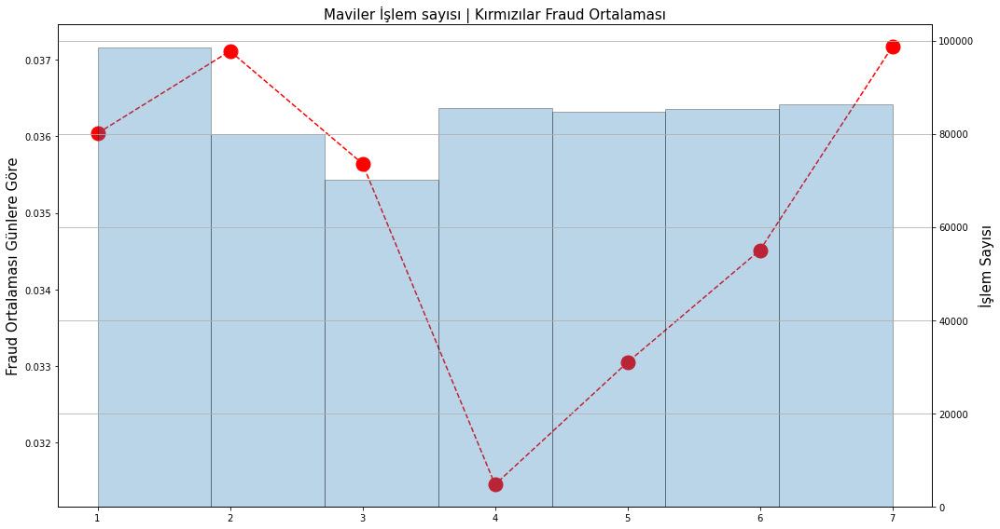

In [32]:
# Hist plot günün kaçtane içerdiğini gösteriyor
# Biz bunun üzerine günlerin ortalama fraud koyarak hangi gün daha yüksek bir fraud gerçekleşmiş onu
# görüyoruz !!!

size = 15
plt.figure(figsize = (15,8))

without_hue_day_mean = train.groupby("days")["isFraud"].mean()

plt.plot(without_hue_day_mean, "r--",marker="o",markersize = size)
plt.ylabel("Fraud Ortalaması Günlere Göre",fontsize = size)

plt.twinx()
plt.hist(train["days"],bins = 7, alpha = 0.3, edgecolor = "black")

plt.xlabel("Days", fontsize = size)

plt.ylabel("İşlem Sayısı" , fontsize = size)
plt.title("Maviler İşlem sayısı | Kırmızılar Fraud Ortalaması" , fontsize = size)
plt.grid(True)
plt.tight_layout()
plt.show()

***Days Değişkeni için scorelar belirleyelim***

* 1,2,7 Yüksek Risk
* 3, 6 Orta Risk
* 4, 5 Düşük Risk

In [33]:
def day_risk(dataframe):
    
    day = dataframe
    
    if day == 1 or day == 2 or day == 7:
        return "HighRiskDays"
    
    elif day == 3 or day == 6:
        return "MiddleRiskDays"
    
    else:
        return "LowerRiskDays"

In [34]:
train["day_risk"] = train["days"].apply(day_risk)
test["day_risk"] = test["days"].apply(day_risk)

In [35]:
train["day_risk"].unique(),test["day_risk"].unique()

(array(['HighRiskDays', 'MiddleRiskDays', 'LowerRiskDays'], dtype=object),
 array(['HighRiskDays', 'MiddleRiskDays', 'LowerRiskDays'], dtype=object))

In [36]:
train[["days","day_risk"]].head(2000).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [37]:
#train[train["day"] == 6][["day","day_risk"]]

## Hours

In [38]:
train["hours"] = ((train["TransactionDT"] // (60*60)) % 24) + 1
test["hours"] = ((test["TransactionDT"] // (60*60) ) % 24) + 1

In [39]:
train["hours"].nunique(),test["hours"].nunique()

(24, 24)

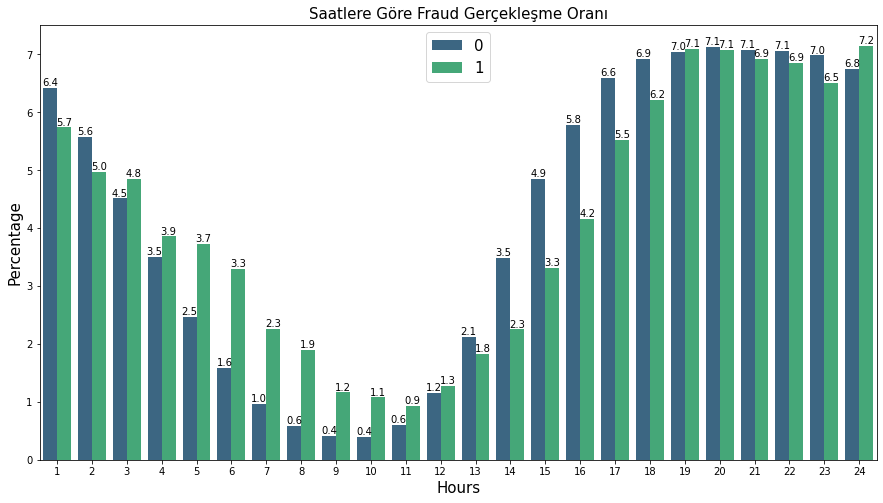

In [40]:
hours_data = train.groupby("isFraud")["hours"].value_counts(normalize = True).mul(100).rename("percentage").\
reset_index().sort_values("hours")

plt.figure(figsize = (15,8))

hours_bar = sns.barplot(x = "hours", y = "percentage", data = hours_data , hue = hours_data["isFraud"],
                        palette = "viridis")


for p in hours_bar.patches:
    hours_bar.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

size = 15
plt.title("Saatlere Göre Fraud Gerçekleşme Oranı" , fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.xlabel("Hours", fontsize = size)
plt.legend(loc = "upper center",fontsize = size)
plt.show()

In [41]:
train[train["days"] == 1]["isFraud"].value_counts()

0    94952
1     3550
Name: isFraud, dtype: int64

In [42]:
3550 / (94952 + 3550)

0.03603987736289618

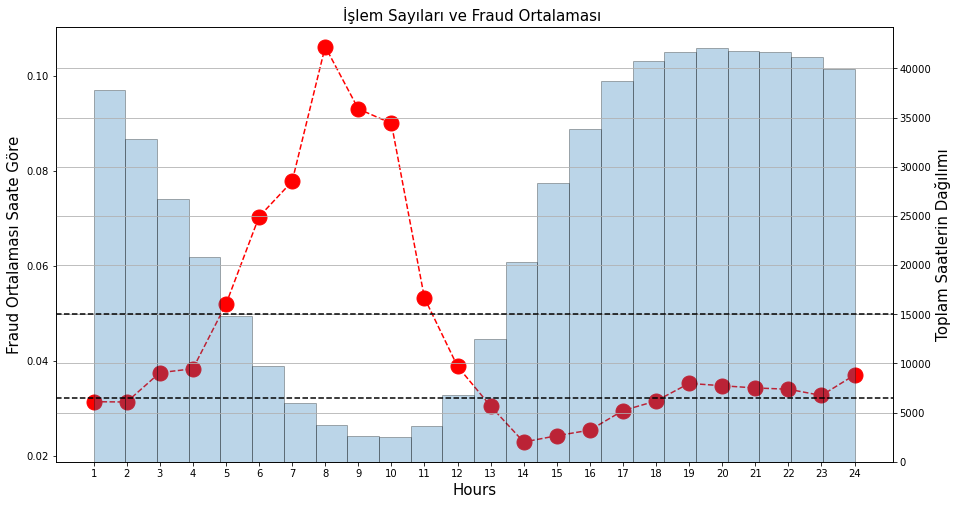

In [43]:
without_hue_hours_mean = train.groupby("hours")["isFraud"].mean()

size = 15

plt.figure(figsize = (15,8))

plt.plot(without_hue_hours_mean, "r--", marker = "o", markersize = size,)
plt.ylabel("Fraud Ortalaması Saate Göre",fontsize = size)
plt.xlabel("Hours",fontsize = size)

plt.twinx()
plt.hist(train["hours"], bins = 24,edgecolor = "black", alpha = .3)

plt.title("İşlem Sayıları ve Fraud Ortalaması " ,fontsize = size)
plt.ylabel("Toplam Saatlerin Dağılımı", fontsize = size)

plt.xticks(range(1,25))
plt.grid(True)
plt.axhline(6500,linestyle = "--",color = "black")
plt.axhline(15000,linestyle ="--", color = "black")
plt.show()

***Hours Değişkeni İçin Score'lar Belirleyelim***

* 5,6,7,8,9,10,11 Yüksek Risk

* 3,4,12,19,20,21,22,23,24 Orta Risk

* 1,2,13,14,15,16,17,18 Düşük Risk

In [44]:
def hours_risk(dataframe):
    
    hours = dataframe
    
    
    if hours in [5,6,7,8,9,10,11]:
        
        return "UpperRiskHours"
    
    elif hours in [3,4,12,19,20,21,22,23,24] :
        
        return "MiddleRiskHours"
    
    else:
        
        return "LowRiskHours"

In [45]:
train["hours_risk"] = train["hours"].apply(hours_risk)
test["hours_risk"] = test["hours"].apply(hours_risk)

In [46]:
train[train["hours_risk"] == "LowRiskHours"][["hours_risk","hours"]].head(200).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
hours_risk,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours,LowRiskHours
hours,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [47]:
train["hours_risk"].value_counts()

MiddleRiskHours    302626
LowRiskHours       244966
UpperRiskHours      42948
Name: hours_risk, dtype: int64

In [48]:
toplam = 0

for i in [5,6,7,8,9,10,11]:
    toplam+=train[train["hours"] == i]["hours"].count()

toplam    

42948

In [49]:
toplam = 0

for i in [3,4,12,19,20,21,22,23,24]:
    toplam+=train[train["hours"] == i]["hours"].count()

toplam

302626

In [50]:
toplam = 0

for i in [1,2,13,14,15,16,17,18]:
    toplam+=train[train["hours"] == i]["hours"].count()

toplam

244966

## TransactionAMT

In [51]:
describe = pd.DataFrame()

describe["TransactionAmt_Train"] = train["TransactionAmt"].describe()
describe["TransactionAmt_Test"] = test["TransactionAmt"].describe()

describe

,TransactionAmt_Train,TransactionAmt_Test
count,590540.0000,506691.0000
mean,135.0272,134.7256
std,239.1625,245.7798
min,0.2510,0.0180
25%,43.3210,40.0000
50%,68.7690,67.9500
75%,125.0000,125.0000
max,31937.3910,10270.0000


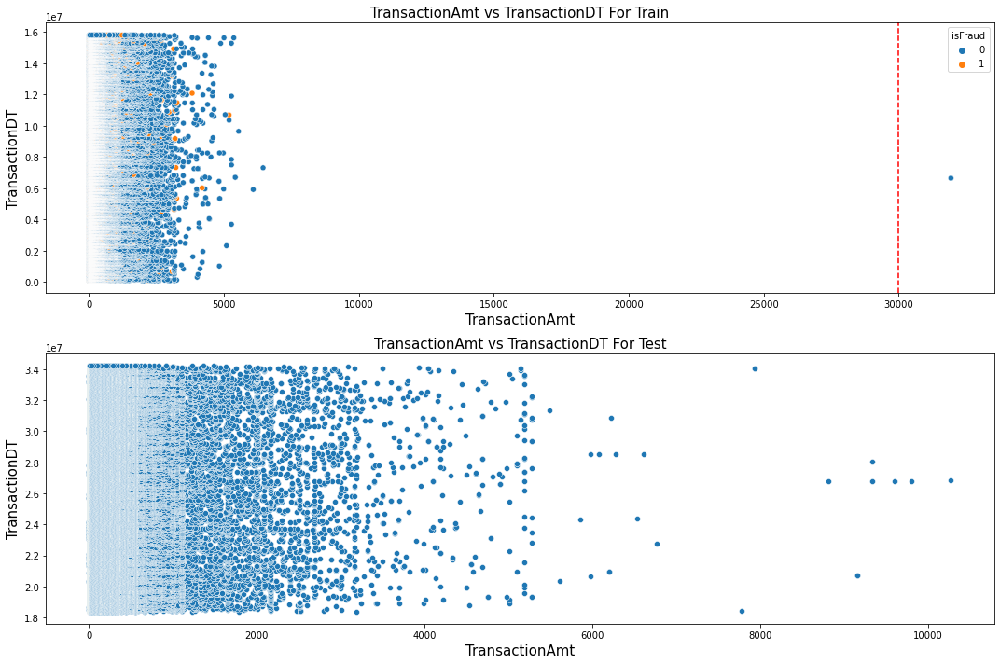

In [52]:
plt.figure(figsize = (15,10))
size = 15

plt.subplot(2,1,1)
sns.scatterplot(x = train["TransactionAmt"] , y = train["TransactionDT"], hue = train["isFraud"] )
plt.title("TransactionAmt vs TransactionDT For Train" , fontsize = size )
plt.xlabel("TransactionAmt", fontsize = size)
plt.ylabel("TransactionDT", fontsize = size)
plt.axvline(30000,linestyle = "--", color = "r")


plt.subplot(2,1,2)
sns.scatterplot(x = test["TransactionAmt"], y = test["TransactionDT"] )
plt.title("TransactionAmt vs TransactionDT For Test" , fontsize = size )
plt.xlabel("TransactionAmt", fontsize = size)
plt.ylabel("TransactionDT", fontsize = size)

plt.tight_layout()
plt.show()

In [53]:
# Burda aynı işlem iki kare gerçekleşmiş !!!!


train[train["TransactionAmt"] > 30000]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,days,day_risk,hours,hours_risk
274336,3261336,0,6652360,31937.3910,W,16075,514.0000,150.0000,mastercard,102.0000,credit,205.0000,87.0000,27.0000,NaN,yahoo.com,NaN,1.0000,2.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,NaN,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,NaN,NaN,0.0000,T,T,T,NaN,NaN,NaN,F,F,T,1.0000,3.0000,3.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,2.0000,2.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,1.0000,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,2.0000,2.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0000,1.00

In [54]:
def check_outliers(dataframe, col_name, q1 = 0.25, q3 = 0.75, details = False):
    
    quantile1 = dataframe[col_name].quantile(q1)
    quantile3 = dataframe[col_name].quantile(q3)
    
    interquantile = quantile3 - quantile1
    
    up_limit = quantile3 + 1.5 * interquantile
    low_limit = quantile1 - 1.5 * interquantile
    
    if details:
        
        up_limit = round(up_limit,4)
        low_limit = round(low_limit,4)
        
        print("Up Limit : {}\nLow Limit : {}".format(up_limit,low_limit))
    
    return up_limit, low_limit

In [55]:
def grap_outliers(dataframe, col_name , q1 = 0.25, q3 = 0.75):
    
    up_limit, low_limit = check_outliers(dataframe, col_name , q1 , q3 ,details = False)
    
    outliers_data = (
            dataframe[ (dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit) ].
            any(axis = None)
    )
    
    if outliers_data:
        
        print(f"{col_name.upper()} için Aykırı Değer Var !!!!")
        
    else:
        
        print(f"{col_name.upper()} için Aykırı Değer Yok !!!!")

In [56]:
up_limit, low_limit = check_outliers(train,"TransactionAmt", details = True)

Up Limit : 247.5185
Low Limit : -79.1975


In [57]:
grap_outliers(train , "TransactionAmt")

TRANSACTIONAMT için Aykırı Değer Var !!!!


In [58]:
# Burdaki Train için TransactionAmt benzer olan işlemleri çıkar !!!

train = train[~(train["TransactionAmt"] > 30000)]

In [59]:
# Düzelecek !!!! Merak Etme !!!

describe["New_TransactionAmt_Train"] = train["TransactionAmt"].describe()

describe.T


,count,mean,std,min,25%,50%,75%,max
TransactionAmt_Train,590540.0000,135.0272,239.1625,0.2510,43.3210,68.7690,125.0000,31937.3910
TransactionAmt_Test,506691.0000,134.7256,245.7798,0.0180,40.0000,67.9500,125.0000,10270.0000
New_TransactionAmt_Train,590538.0000,134.9195,231.8913,0.2510,43.3210,68.7580,125.0000,6450.9700


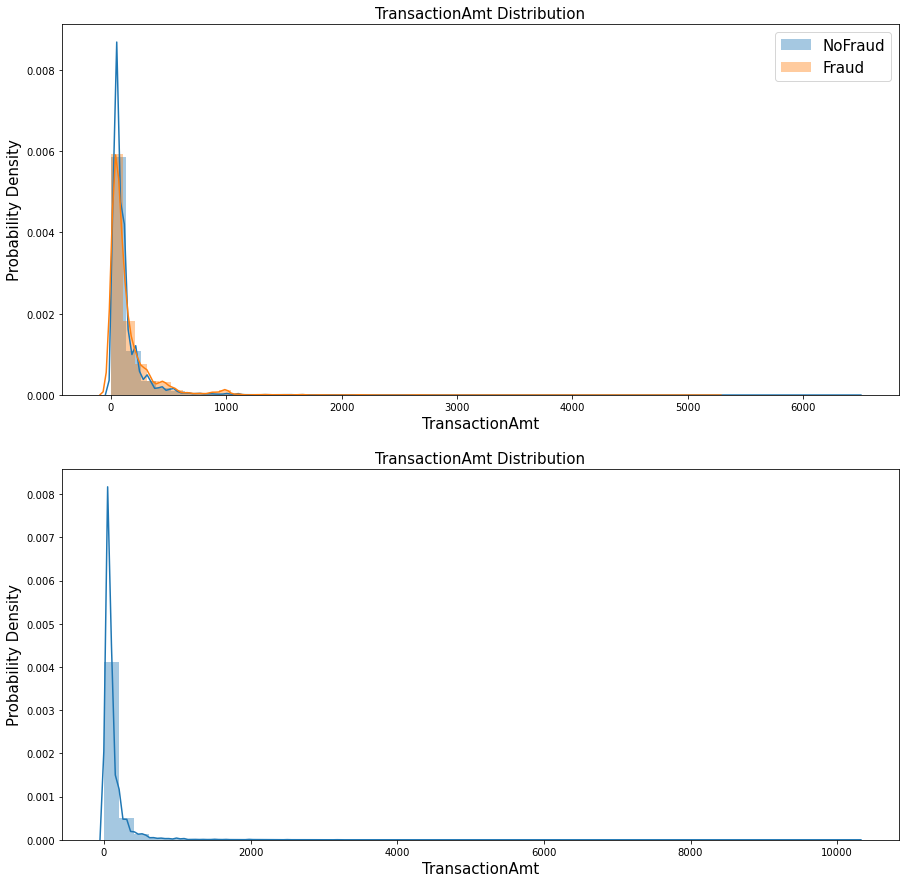

In [60]:
plt.figure(figsize = (15,15))

size = 15

plt.subplot(2,1,1)

sns.distplot(train[train["isFraud"] == 0 ]["TransactionAmt"], label = "NoFraud")
sns.distplot(train[train["isFraud"] == 1 ]["TransactionAmt"], label = "Fraud")

plt.xlabel("TransactionAmt" , fontsize = size)
plt.ylabel("Probability Density" , fontsize = size)
plt.title("TransactionAmt Distribution", fontsize = size) 
plt.legend(loc = "best",fontsize = size)



plt.subplot(2,1,2)

sns.distplot(test["TransactionAmt"] )


plt.xlabel("TransactionAmt" , fontsize = size)
plt.ylabel("Probability Density" , fontsize = size)
plt.title("TransactionAmt Distribution", fontsize = size) 

plt.show()

In [61]:
train["LogTransactionAmt"] = np.log(train["TransactionAmt"])
test["LogTransactionAmt"] = np.log(test["TransactionAmt"])

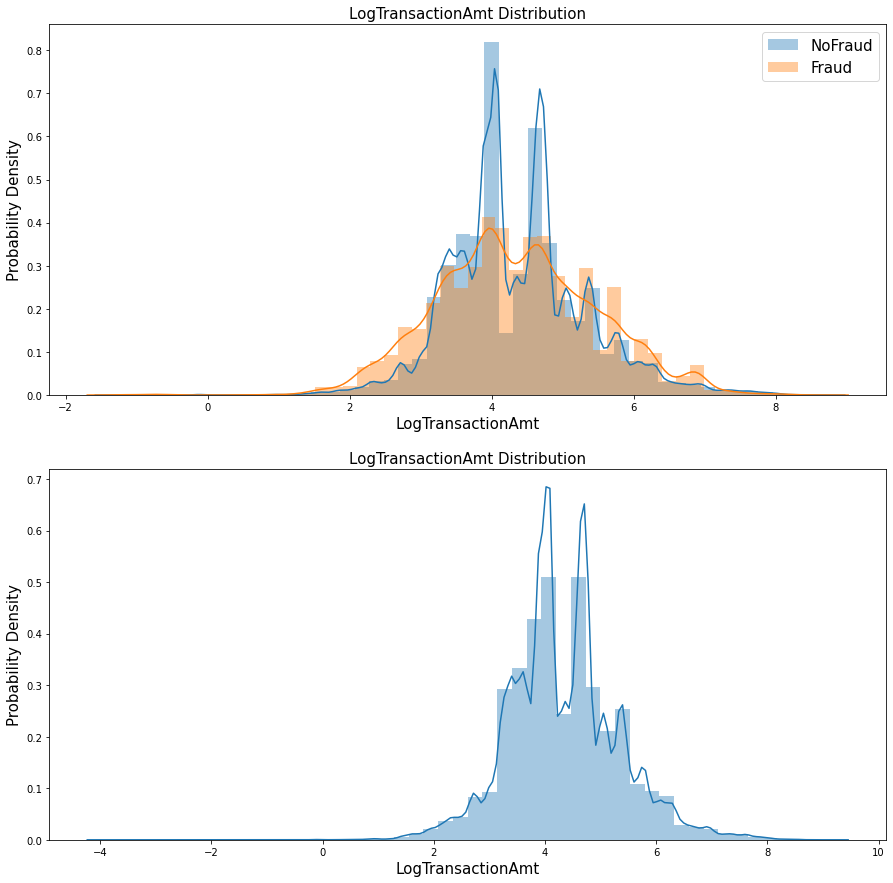

In [62]:
plt.figure(figsize = (15,15))

size = 15

plt.subplot(2,1,1)

sns.distplot(train[train["isFraud"] == 0 ]["LogTransactionAmt"], label = "NoFraud")
sns.distplot(train[train["isFraud"] == 1 ]["LogTransactionAmt"], label = "Fraud")

plt.xlabel("LogTransactionAmt" , fontsize = size)
plt.ylabel("Probability Density" , fontsize = size)
plt.title("LogTransactionAmt Distribution", fontsize = size) 
plt.legend(loc = "best",fontsize = size)



plt.subplot(2,1,2)

sns.distplot(test["LogTransactionAmt"] )


plt.xlabel("LogTransactionAmt" , fontsize = size)
plt.ylabel("Probability Density" , fontsize = size)
plt.title("LogTransactionAmt Distribution", fontsize = size) 

plt.show()

***Bu iki aralıkta Fraud olma olasılığı daha az iken;***

***Diğer aralıklarda Fraud olma olasılığı daha yüksektir....***

In [63]:
log_mean = train["LogTransactionAmt"].mean()
log_std = train["LogTransactionAmt"].std()

high, low = round(log_mean + log_std , 3) , round(log_mean - log_std, 3)

print("High Price : {}\nLow Price : {}".format(high, low))

High Price : 5.318
Low Price : 3.41


In [64]:
def Log_TransactionAmt_Risk(dataframe):
    
    log_transactionamt_risk = dataframe
    
    if log_transactionamt_risk < 5.318 and log_transactionamt_risk > 3.41:
        
        return "HighRisk"
    
    else:
        
        return "LowRisk"

In [65]:
train["Risk_TransactionAmt"] = train["LogTransactionAmt"].apply(Log_TransactionAmt_Risk)
test["Risk_TransactionAmt"]  = test["LogTransactionAmt"].apply(Log_TransactionAmt_Risk)

In [66]:
train[["Risk_TransactionAmt","LogTransactionAmt"]].head()

,Risk_TransactionAmt,LogTransactionAmt
0,HighRisk,4.2268
1,LowRisk,3.3673
2,HighRisk,4.0775
3,HighRisk,3.9120
4,HighRisk,3.9120


In [67]:
train["Risk_TransactionAmt"].value_counts()

HighRisk    413161
LowRisk     177377
Name: Risk_TransactionAmt, dtype: int64

## ProductCD

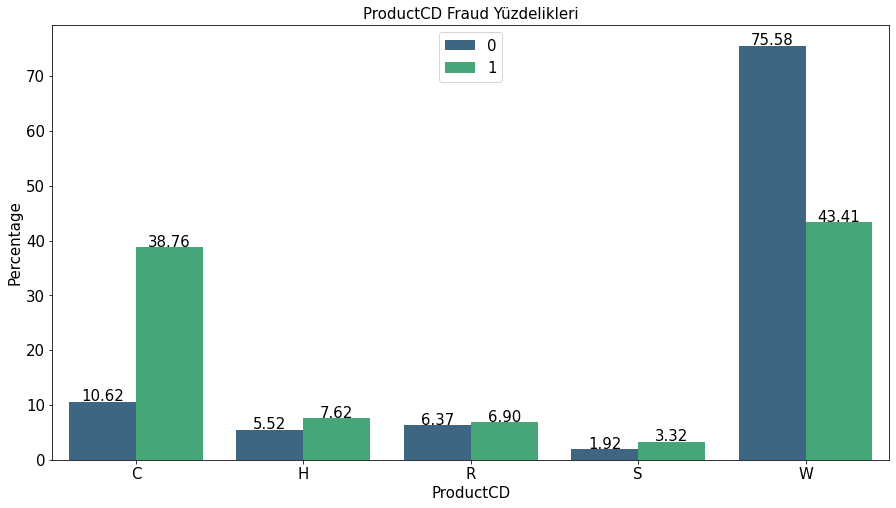

In [68]:
productCD_data= \
train.groupby("isFraud")["ProductCD"].value_counts(normalize = True).mul(100).rename("percentage").\
reset_index().sort_values("ProductCD")


plt.figure(figsize = (15,8))
productCD_bar = sns.barplot(x = "ProductCD", y = "percentage", data = productCD_data, hue = "isFraud", palette = "viridis")

for p in productCD_bar.patches:
    productCD_bar.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points',size = size)


size = 15
plt.xlabel("ProductCD", fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("ProductCD Fraud Yüzdelikleri",fontsize = size)
plt.legend(loc = "upper center",fontsize = size)
plt.xticks(fontsize = size)
plt.yticks(fontsize = size)
plt.show()


In [69]:
def Risk_ProductCD(dataframe):
    
    productCD = dataframe
    
    if productCD == "C":
        
        return "HighRiskProductCD"
    
    elif productCD == "W":
    
        return "MiddleRiskProductCD"
    
    else:
        
        return "LowRiskProductCD"

In [70]:
train["Risk_ProductCD"]= train["ProductCD"].apply(Risk_ProductCD)
test["Risk_ProductCD"] = test["ProductCD"].apply(Risk_ProductCD)

In [71]:
train[["ProductCD","Risk_ProductCD"]].head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
ProductCD,W,W,W,W,H,W,W,W,H,W,C,C,W,W,W,W,H,H,W,W
Risk_ProductCD,MiddleRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,LowRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,LowRiskProductCD,MiddleRiskProductCD,HighRiskProductCD,HighRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD,LowRiskProductCD,LowRiskProductCD,MiddleRiskProductCD,MiddleRiskProductCD


## Card

In [72]:
train.loc[:,train.columns.str.contains("card")].head(5)

,card1,card2,card3,card4,card5,card6
0,13926,NaN,150.0000,discover,142.0000,credit
1,2755,404.0000,150.0000,mastercard,102.0000,credit
2,4663,490.0000,150.0000,visa,166.0000,debit
3,18132,567.0000,150.0000,mastercard,117.0000,debit
4,4497,514.0000,150.0000,mastercard,102.0000,credit


In [73]:
data_card = [ "card"+str(i) for i in range(1,7)]

card_describe = pd.DataFrame()

card_num = []
card_cat = []

for col in data_card:
    
    if train[col].dtype != "object":
        
        card_num.append(col)
        
        card_describe[col] = train[col].describe()
    
    else:
        
        card_cat.append(col)
        
card_describe.T

,count,mean,std,min,25%,50%,75%,max
card1,590538.0000,9898.7137,4901.1653,1000.0000,6019.0000,9678.0000,14182.7500,18396.0000
card2,581605.0000,362.5550,157.7933,100.0000,214.0000,361.0000,512.0000,600.0000
card3,588973.0000,153.1949,11.3365,100.0000,150.0000,150.0000,150.0000,231.0000
card5,586279.0000,199.2792,41.2441,100.0000,166.0000,226.0000,226.0000,237.0000


In [74]:
print("Card Numberic : {}\nCard Categoric : {}".format(card_num,card_cat) )

Card Numberic : ['card1', 'card2', 'card3', 'card5']
Card Categoric : ['card4', 'card6']


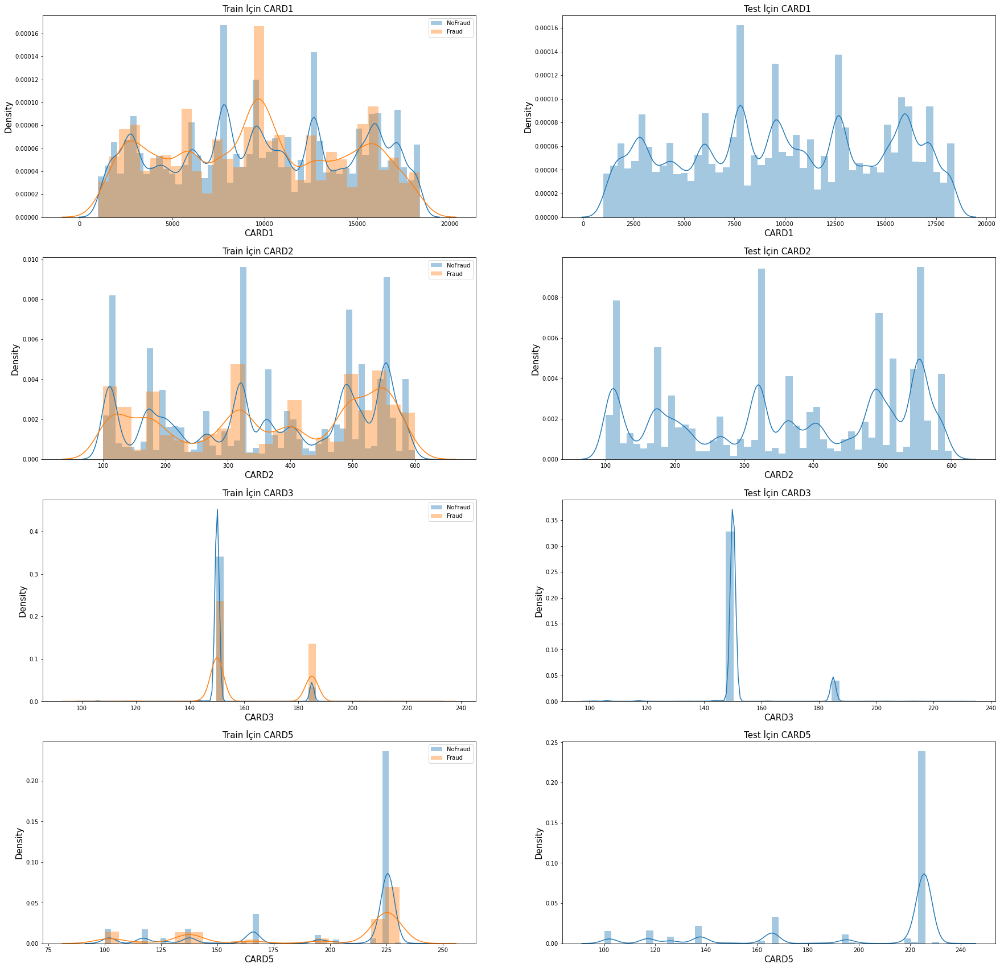

In [75]:
plt.figure(figsize = (30,30))
num = 1

for col_name in card_num:
    
    plt.subplot(4,2,num)
    
    sns.distplot( train[(train["isFraud"] == 0) & (~train[col_name].isnull())][col_name] \
                  ,label = "NoFraud")
    
    sns.distplot( train[(train["isFraud"] == 1) & (~train[col_name].isnull())][col_name] \
                  ,label = "Fraud")
    
    plt.title(f"Train İçin {col_name.upper()} ", fontsize = size)
    plt.xlabel(f"{col_name.upper()}" , fontsize = size)
    plt.ylabel("Density" , fontsize = size)
    plt.legend(loc = "upper right")
    
    
    num+=1
    
    plt.subplot(4,2,num)
    
    sns.distplot(test[~(test[col_name].isnull())][col_name])
    
    plt.xlabel(f"{col_name.upper()}" , fontsize = size)
    plt.ylabel("Density" , fontsize = size)
    plt.title(f"Test İçin {col_name.upper()} ", fontsize = size)
    
    num+=1
    
plt.show()

In [ ]:
plt.figure(figsize = (30,30))
num = 1

for col_name in card_num:
    
    plt.subplot(4,2,num)
    
    sns.distplot( train[(train["isFraud"] == 0)][col_name] \
                  ,label = "NoFraud")
    
    sns.distplot( train[(train["isFraud"] == 1)][col_name] \
                  ,label = "Fraud")
    
    plt.title(f"Train İçin {col_name.upper()} ", fontsize = size)
    plt.xlabel(f"{col_name.upper()}" , fontsize = size)
    plt.ylabel("Density" , fontsize = size)
    plt.legend(loc = "upper right")
    
    
    num+=1
    
    plt.subplot(4,2,num)
    
    sns.distplot(test[col_name])
    
    plt.xlabel(f"{col_name.upper()}" , fontsize = size)
    plt.ylabel("Density" , fontsize = size)
    plt.title(f"Test İçin {col_name.upper()} ", fontsize = size)
    
    num+=1
    
plt.show()

In [76]:
for col in data_card:
    
    print("{} ---> NaN Count : {}".format(col, train[col].isnull().sum()))

card1 ---> NaN Count : 0
card2 ---> NaN Count : 8933
card3 ---> NaN Count : 1565
card4 ---> NaN Count : 1577
card5 ---> NaN Count : 4259
card6 ---> NaN Count : 1571


In [77]:
train[train["card3"] > 160]["isFraud"].value_counts()

0    51169
1     7447
Name: isFraud, dtype: int64

In [78]:
train[train["card3"] <= 160]["isFraud"].value_counts()

0    517180
1     13177
Name: isFraud, dtype: int64

In [79]:
# Positive ---- > 1 Fraud
# Negative ---- > 0 No Fraud


def card3_create(dataframe):
    
    card3 = dataframe
    
    if card3 > 160 :
        return "Positive"
    
    elif card3 <= 160 :
        return "Negative"
    
    else:
        return "UnKnown"

In [80]:
train["card3_feature"] = train["card3"].apply(card3_create)
test["card3_feature"] = test["card3"].apply(card3_create)

In [81]:
train["card3_feature"].value_counts()

Negative    530357
Positive     58616
UnKnown       1565
Name: card3_feature, dtype: int64

In [82]:
test["card3_feature"].value_counts()

Negative    446482
Positive     57207
UnKnown       3002
Name: card3_feature, dtype: int64

In [83]:
np.nan > 1 , np.nan < -1, np.nan == 1

(False, False, False)

In [84]:
card_cat

['card4', 'card6']

In [85]:
#fig, axes = plt.subplots(2,1,figsize = (12, 12))

train_card4 = (
    train[~(train["card4"].isnull())].groupby("isFraud")["card4"].value_counts(normalize = True).
    rename("percentage").mul(100).reset_index().sort_values("card4")

)

In [86]:
train[train["isFraud"] == 0]["card4"].value_counts() / len(train[train["isFraud"] == 0]) * 100

visa               65.1711
mastercard         32.0630
american express    1.4194
discover            1.0769
Name: card4, dtype: float64

In [87]:
train_card4[train_card4["isFraud"] == 0]

,isFraud,card4,percentage
2,0,american express,1.4233
3,0,discover,1.0798
1,0,mastercard,32.1497
0,0,visa,65.3473


In [88]:
pd.DataFrame(((train.groupby("card4")["isFraud"].value_counts() / len(train)) * 100)).reset_index(0)

,card4,isFraud
isFraud,,
0,american express,1.3698
1,american express,0.0405
0,discover,1.0392
1,discover,0.0870
0,mastercard,30.9411
1,mastercard,1.1000
0,visa,62.8908
1,visa,2.2645


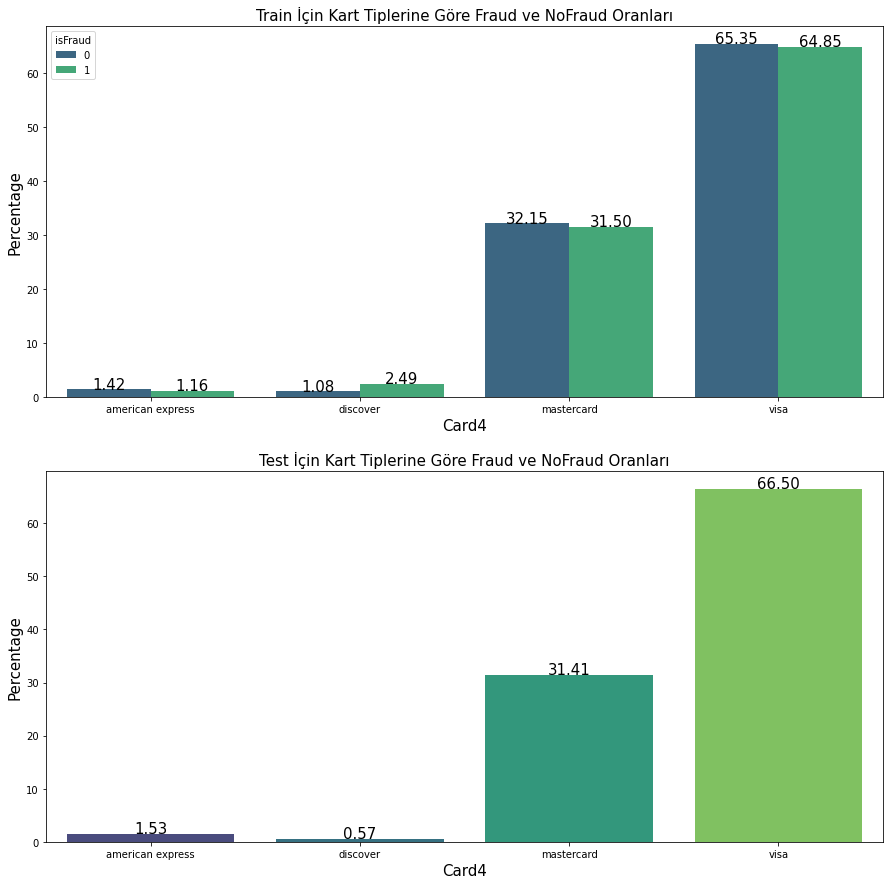

In [92]:
train_card4 = (
    train[~(train["card4"].isnull())].groupby("isFraud")["card4"].value_counts(normalize = True).
    rename("percentage").mul(100).reset_index().sort_values("card4")
    )

test_card4 = (
    test[~(test["card4"].isnull())]["card4"].value_counts(normalize = True).mul(100).
    rename("percentage").reset_index()
    )

test_card4.columns = ["card4","Percentage"]
test_card4 = test_card4.sort_values("card4")


fig, axes = plt.subplots(2,1,figsize = (15,15))

card4_train_bar = sns.barplot(x = "card4", y = "percentage", data = train_card4, 
                              hue = "isFraud",ax= axes[0],palette = "viridis")

card4_test_bar = sns.barplot(x = "card4" , y = "Percentage", data = test_card4, ax = axes[1],
                             palette = "viridis")

for p in card4_test_bar.patches:
    card4_test_bar.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center', 
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)

for p in card4_train_bar.patches:
    card4_train_bar.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center',
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)
    
size = 15
axes[0].set_title("Train İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[0].set_xlabel("Card4", fontsize = size)
axes[0].set_ylabel("Percentage", fontsize = size)


axes[1].set_title("Test İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[1].set_xlabel("Card4", fontsize = size)
axes[1].set_ylabel("Percentage", fontsize = size)


plt.show()

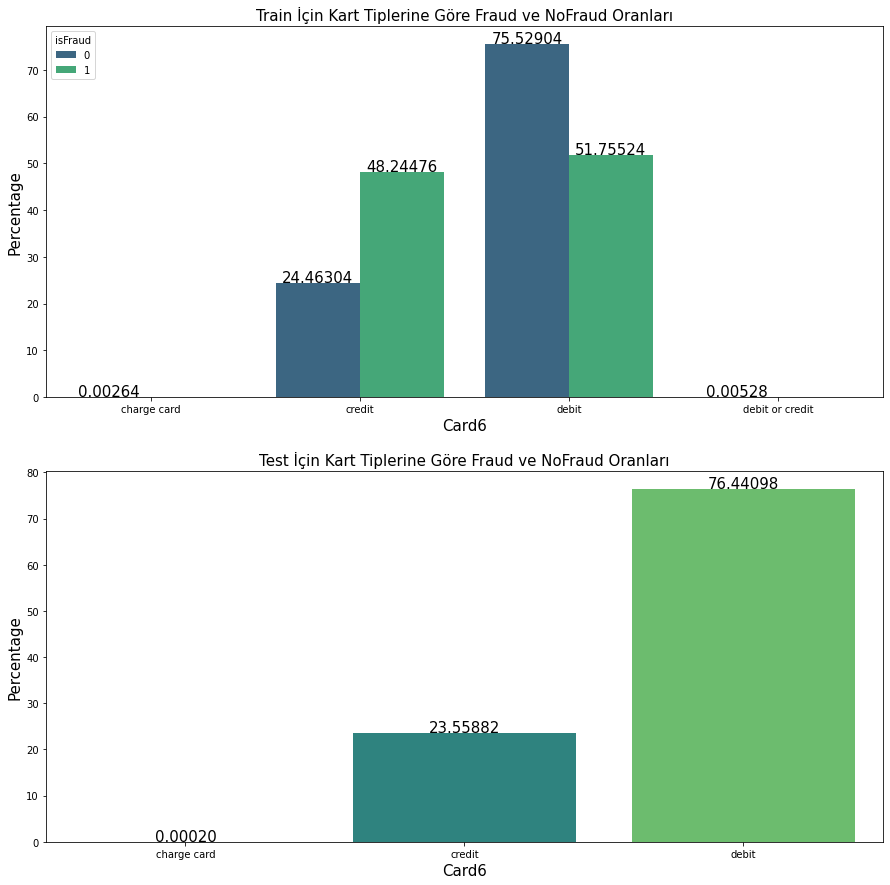

In [93]:
train_card6 = (
    train[~(train["card6"].isnull())].groupby("isFraud")["card6"].value_counts(normalize = True).
    rename("percentage").mul(100).reset_index().sort_values("card6")
    )

test_card6 = (
    test[~(test["card6"].isnull())]["card6"].value_counts(normalize = True).mul(100).
    rename("percentage").reset_index()
    )

test_card6.columns = ["card6","Percentage"]
test_card6 = test_card6.sort_values("card6")


fig, axes = plt.subplots(2,1,figsize = (15,15))

card6_train_bar = sns.barplot(x = "card6", y = "percentage", data = train_card6, 
                              hue = "isFraud",ax= axes[0],palette="viridis")

card6_test_bar = sns.barplot(x = "card6" , y = "Percentage", data = test_card6, ax = axes[1],
                             palette="viridis")

for p in card6_test_bar.patches:
    card6_test_bar.annotate(format(p.get_height(), '.5f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center', 
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)

for p in card6_train_bar.patches:
    card6_train_bar.annotate(format(p.get_height(), '.5f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center',
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)
    
size = 15
axes[0].set_title("Train İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[0].set_xlabel("Card6", fontsize = size)
axes[0].set_ylabel("Percentage", fontsize = size)


axes[1].set_title("Test İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[1].set_xlabel("Card6", fontsize = size)
axes[1].set_ylabel("Percentage", fontsize = size)


plt.show()

In [94]:
print("Train Verisi İçin %s Tane Charge Card Gözlem Vardır ..." 
      % train[train["card6"] == "charge card"].shape[0])

print("Train Verisi İçin %s Tane Debit or Credit Gözlem Vardır ..." 
      % train[train["card6"] == "debit or credit"].shape[0])

Train Verisi İçin 15 Tane Charge Card Gözlem Vardır ...
Train Verisi İçin 30 Tane Debit or Credit Gözlem Vardır ...


In [95]:
for col in data_card:
    print(f"{col} ---> {train[col].isnull().sum()}")

card1 ---> 0
card2 ---> 8933
card3 ---> 1565
card4 ---> 1577
card5 ---> 4259
card6 ---> 1571


In [96]:
def replace_card(dataframe):
    
    card6 = dataframe
    
    if card6 == "charge card" or card6 == "debit or credit":
        
        return "debit"
    
    else:
        
        return card6

In [97]:
train["card6"] = train["card6"].fillna("UnKnown")
test["card6"] = test["card6"].fillna("UnKnown")

In [98]:
train["card6"] = train["card6"].apply(replace_card)
test["card6"] = test["card6"].apply(replace_card)

In [99]:
train["card6"].unique(),test["card6"].unique()

(array(['credit', 'debit', 'UnKnown'], dtype=object),
 array(['debit', 'credit', 'UnKnown'], dtype=object))

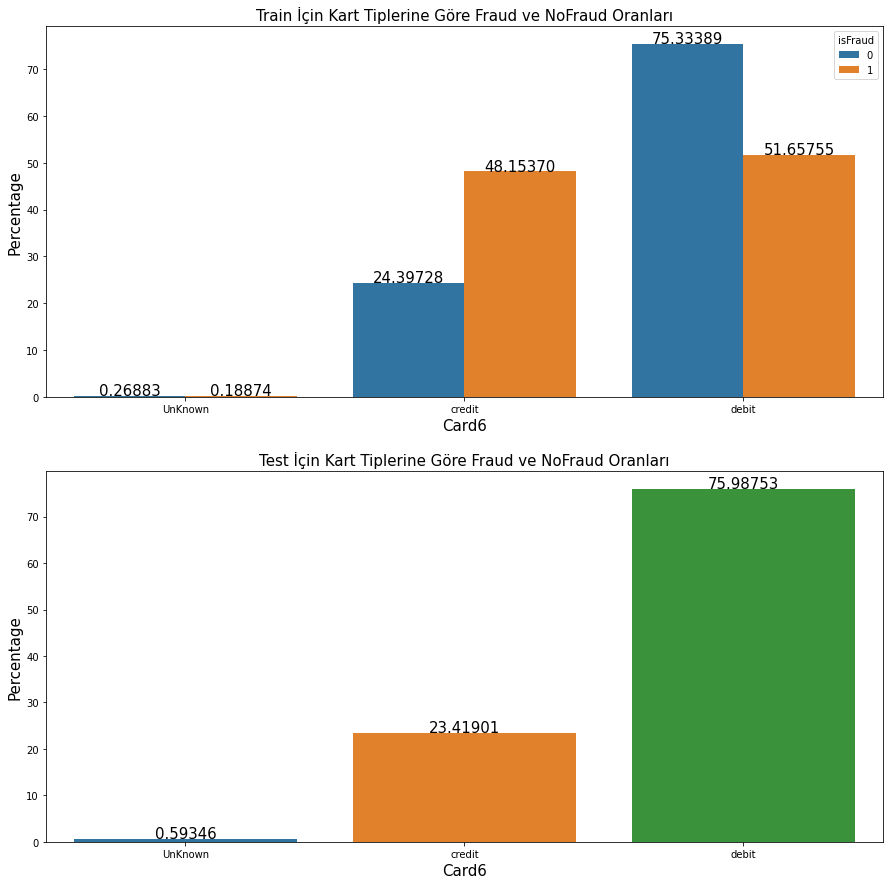

In [100]:
train_card6 = (
    train[~(train["card6"].isnull())].groupby("isFraud")["card6"].value_counts(normalize = True).
    rename("percentage").mul(100).reset_index().sort_values("card6")
    )

test_card6 = (
    test[~(test["card6"].isnull())]["card6"].value_counts(normalize = True).mul(100).
    rename("percentage").reset_index()
    )

test_card6.columns = ["card6","Percentage"]
test_card6 = test_card6.sort_values("card6")


fig, axes = plt.subplots(2,1,figsize = (15,15))

card6_train_bar = sns.barplot(x = "card6", y = "percentage", data = train_card6, 
                              hue = "isFraud",ax= axes[0])

card6_test_bar = sns.barplot(x = "card6" , y = "Percentage", data = test_card6, ax = axes[1])

for p in card6_test_bar.patches:
    card6_test_bar.annotate(format(p.get_height(), '.5f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center', 
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)

for p in card6_train_bar.patches:
    card6_train_bar.annotate(format(p.get_height(), '.5f'), (p.get_x() + p.get_width() / 2., p.get_height()), \
                     ha = 'center', va = 'center',
                     xytext = (0, 5), textcoords = 'offset points',fontsize = 15)
    
size = 15
axes[0].set_title("Train İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[0].set_xlabel("Card6", fontsize = size)
axes[0].set_ylabel("Percentage", fontsize = size)


axes[1].set_title("Test İçin Kart Tiplerine Göre Fraud ve NoFraud Oranları", fontsize = size)
axes[1].set_xlabel("Card6", fontsize = size)
axes[1].set_ylabel("Percentage", fontsize = size)


plt.show()

## addr1 and addr2

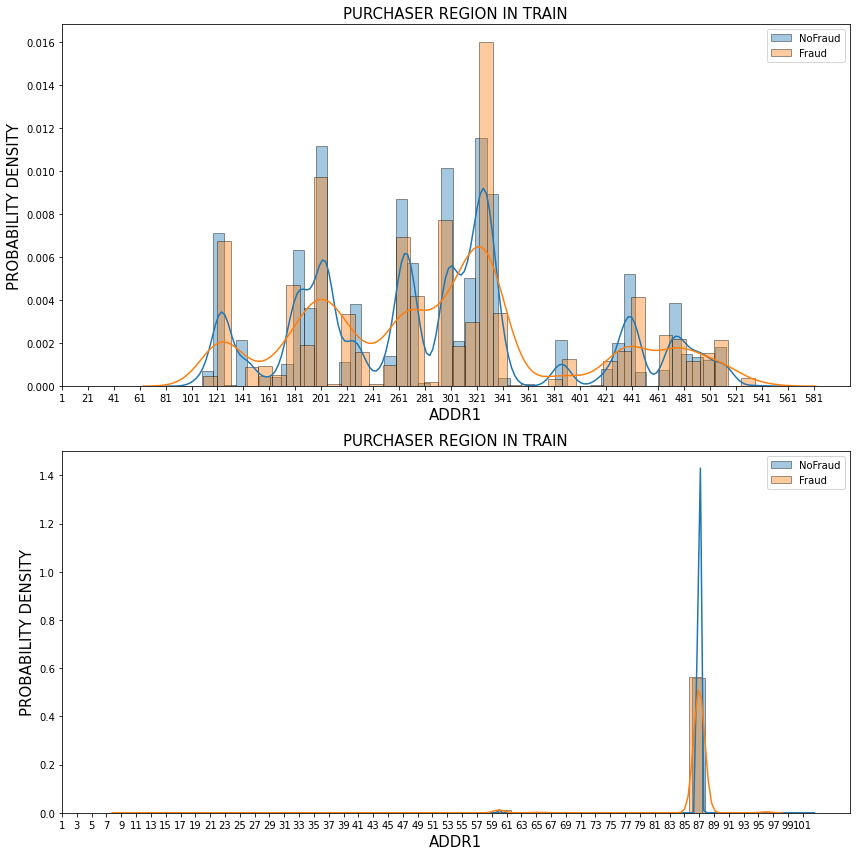

In [101]:
fig , axes = plt.subplots(2,1, figsize = (12,12))

sns.distplot(train[(train["isFraud"] == 0) & (~train["addr1"].isnull())]["addr1"], 
             ax = axes[0],label = "NoFraud",hist_kws={"edgecolor" : "black"})
sns.distplot(train[(train["isFraud"] == 1) & (~train["addr1"].isnull())]["addr1"],
             ax = axes[0],label = "Fraud",hist_kws={"edgecolor" : "black"})


sns.distplot(train[(train["isFraud"] == 0) & (~train["addr2"].isnull())]["addr2"],
             ax = axes[1],label = "NoFraud",hist_kws={"edgecolor" : "black"})
sns.distplot(train[(train["isFraud"] == 1) & (~train["addr2"].isnull())]["addr2"],
             ax = axes[1],label = "Fraud",hist_kws={"edgecolor" : "black"})

size = 15
axes[0].set_ylabel("Probability Density".upper() , fontsize = size)
axes[0].set_xlabel("addr1".upper(), fontsize = size)
axes[0].set_title("Purchaser Region in Train".upper() , fontsize = size)
axes[0].legend(loc = "best")
axes[0].set_xticks(range(1,600,20))

axes[1].set_ylabel("Probability Density".upper() , fontsize = size)
axes[1].set_xlabel("addr1".upper(), fontsize = size)
axes[1].set_title("Purchaser Region in Train".upper() , fontsize = size)
axes[1].legend(loc = "best")
axes[1].set_xticks(range(1,102,2))

plt.tight_layout()
plt.show()

In [102]:
# addr2 için yeterli bir bilgi sahibi değiliz !!!!


def addr1_Risk(dataframe):
    
    addr1 = dataframe
    
    if addr1 < 340 and addr1 > 320:
        
        return "Addr1Risk"
    
    else:
        
        return "NoInf"

In [103]:
train["addr1_risk"] = train["addr1"].apply(addr1_Risk)
test["addr1_risk"] = test["addr1"].apply(addr1_Risk)

## dist1 and dist2

In [104]:
gc.collect()

6103

In [105]:
dist_describe = pd.DataFrame()

dist_describe["Train_dist1"] = train["dist1"].describe()
dist_describe["Train_dist2"] = train["dist2"].describe()

dist_describe["Test_dist1"] = test["dist1"].describe()
dist_describe["Test_dist2"] = test["dist2"].describe()

dist_describe.T

,count,mean,std,min,25%,50%,75%,max
Train_dist1,238267.0000,118.5029,371.8735,0.0000,3.0000,8.0000,24.0000,10286.0000
Train_dist2,37627.0000,231.8554,529.0535,0.0000,7.0000,37.0000,206.0000,11623.0000
Test_dist1,215474.0000,87.0653,314.1317,0.0000,3.0000,8.0000,20.0000,8081.0000
Test_dist2,36436.0000,237.1750,556.4508,0.0000,7.0000,44.0000,196.0000,9213.0000


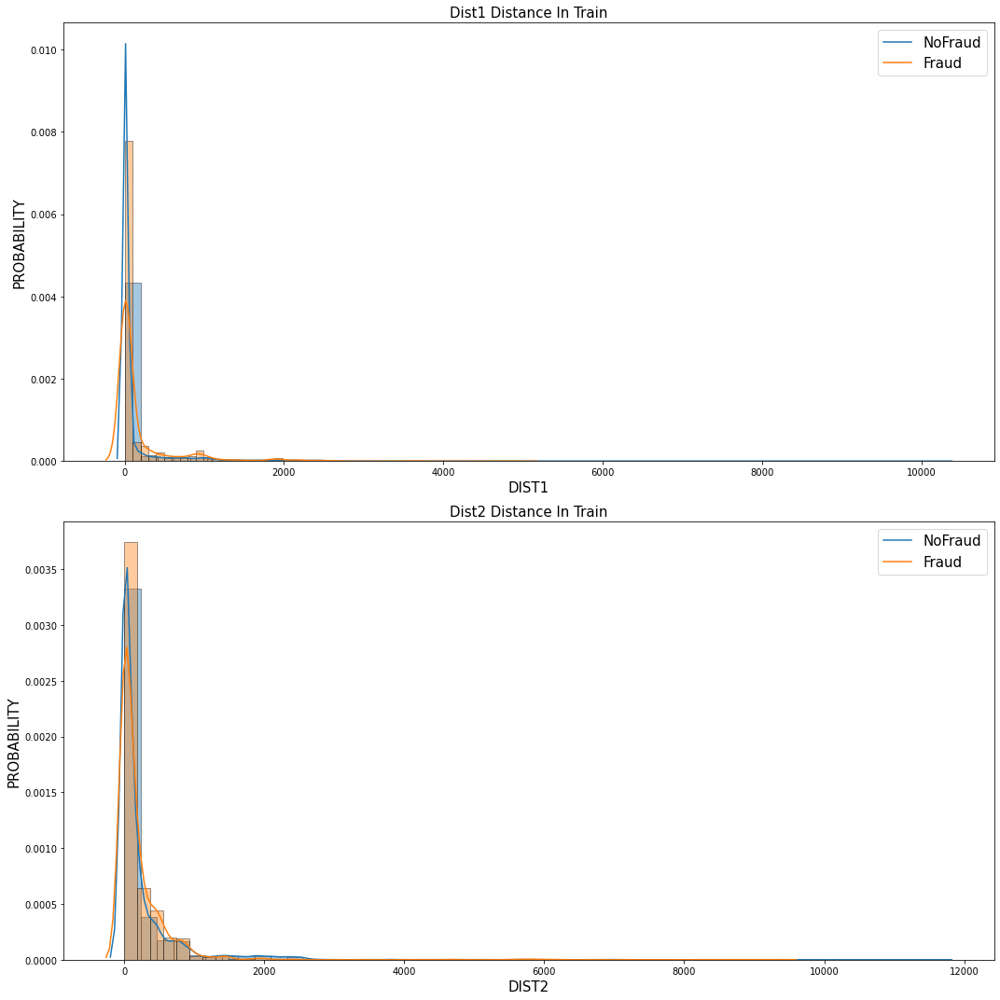

In [106]:
size = 15
plt.figure(figsize = (15,15))

plt.subplot(2,1,1)

sns.distplot(train[(train["isFraud"] == 0) & (~train["dist1"].isnull())]["dist1"],
            hist_kws={"edgecolor":"black"})
sns.distplot(train[(train["isFraud"] == 1) & (~train["dist1"].isnull())]["dist1"],
             hist_kws={"edgecolor":"black"})
               
    
plt.title("Dist1 Distance In Train", fontsize = size)
plt.xlabel("Dist1".upper() , fontsize = size)
plt.ylabel("Probability".upper(), fontsize = size)
plt.legend(["NoFraud","Fraud"],loc = "best",fontsize = size)
                   
                   
plt.subplot(2,1,2)
                   
sns.distplot(train[(train["isFraud"] == 0) & (~train["dist2"].isnull())]["dist2"],
            hist_kws={"edgecolor":"black"})
sns.distplot(train[(train["isFraud"] == 1) & (~train["dist2"].isnull())]["dist2"],
            hist_kws={"edgecolor":"black"})                
                   
                   
plt.title("Dist2 Distance In Train", fontsize = size)
plt.xlabel("Dist2".upper() , fontsize = size)
plt.ylabel("Probability".upper(), fontsize = size)
plt.legend(["NoFraud","Fraud"],loc = "best",fontsize = size)
                   
plt.tight_layout()
plt.show()

In [107]:
def dist1_risk(dataframe):
    
    dist1 = dataframe
    
    if dist1 < 2000:
        
        return "HighDist1Risk"
    
    else:
        
        return "LowDist1Risk"
    
def dist2_risk(dataframe):
    
    dist2 = dataframe
    
    if dist2 < 3000:
        
        return "HighDist2Risk"
    
    else:
        
        return "LowDist2Risk"

In [108]:
train["Dist1_Risk"] = train["dist1"].apply(dist1_risk)
test["Dist1_Risk"] = test["dist1"].apply(dist1_risk)

train["Dist2_Risk"] = train["dist2"].apply(dist2_risk)
test["Dist2_Risk"] = test["dist2"].apply(dist2_risk)

In [109]:
train["Dist1_Risk"].isnull().sum(),train["Dist2_Risk"].isnull().sum()

(0, 0)

In [110]:
gc.collect()

19302

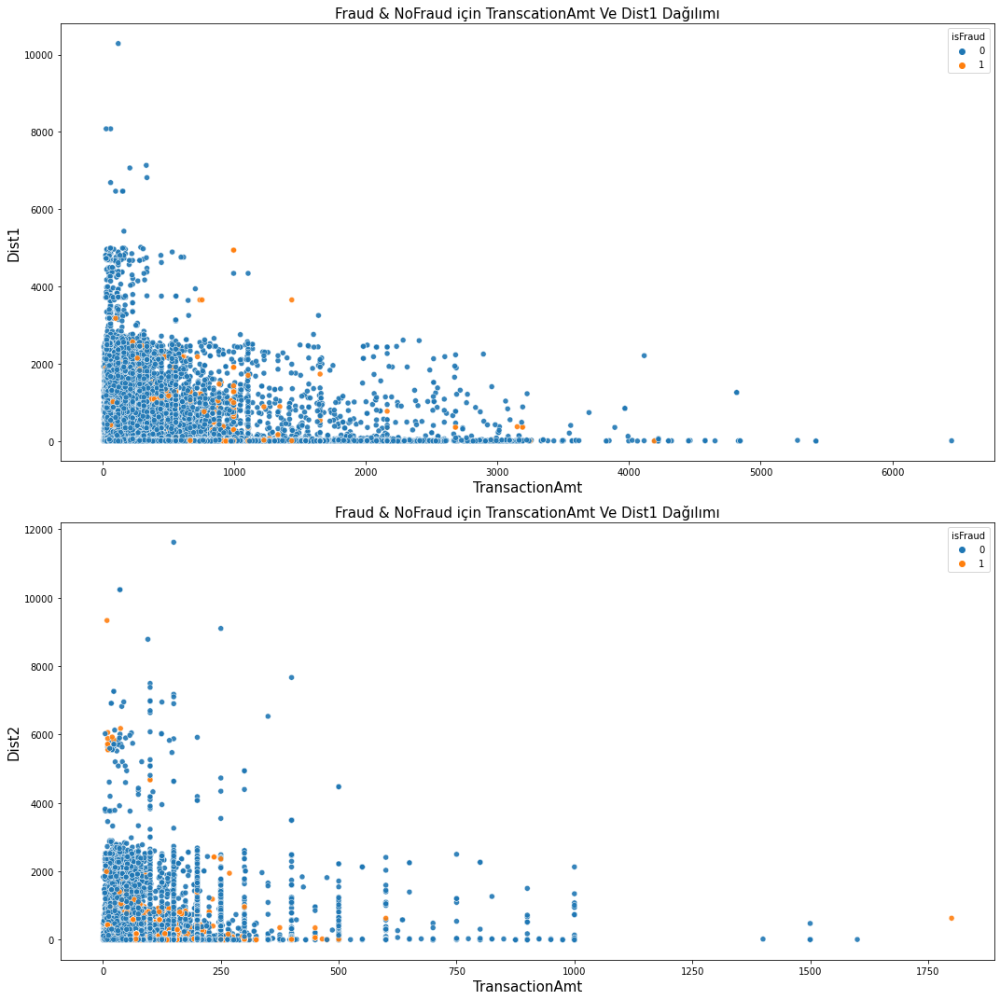

In [111]:
fig, axes = plt.subplots(2, 1 , figsize = (15,15))

sns.scatterplot(x = "TransactionAmt", y = "dist1", data = train[~train["dist1"].isnull()],
                alpha = .9, hue = "isFraud", ax = axes[0])

sns.scatterplot(x = "TransactionAmt", y = "dist2", data = train[~train["dist2"].isnull()],
                alpha = .9, hue = "isFraud", ax = axes[1])

size = 15

axes[0].set_title("Fraud & NoFraud için TranscationAmt Ve Dist1 Dağılımı" , fontsize = size)
axes[1].set_title("Fraud & NoFraud için TranscationAmt Ve Dist1 Dağılımı" , fontsize = size)

#axes[0].legend(fontsize = size)
#axes[1].legend(fontsize = size)

axes[0].set_xlabel("TransactionAmt", fontsize = size)
axes[1].set_xlabel("TransactionAmt", fontsize = size)

axes[0].set_ylabel("Dist1", fontsize = size)
axes[1].set_ylabel("Dist2", fontsize = size)

plt.tight_layout()
plt.show()

In [112]:
print("Before Train Shape : {}".format(train.shape))
train = train[~(train["dist1"] > 6000)]
train = train[~(train["dist1"] > 8000)]
print("After Train Shape : {}".format(train.shape))
gc.collect()

Before Train Shape : (590538, 444)
After Train Shape : (590527, 444)


22063

## P_EmailDomain and R_EmailDomain

In [113]:
print("P_EmailDomain Nan Values : {}".format(train["P_emaildomain"].isnull().sum()))
print("R_EmailDomain Nan Values : {}".format(train["R_emaildomain"].isnull().sum()))

P_EmailDomain Nan Values : 94456
R_EmailDomain Nan Values : 453236


In [114]:
train["P_emaildomain"].fillna("UnKnown", inplace  = True)
train["R_emaildomain"].fillna("UnKnown", inplace  = True)

test["P_emaildomain"].fillna("UnKnown", inplace  = True)
test["R_emaildomain"].fillna("UnKnown", inplace  = True)

print("Train P_EmailDomain Nan Values : {}".format(train["P_emaildomain"].isnull().sum()))
print("Train R_EmailDomain Nan Values : {}".format(train["R_emaildomain"].isnull().sum()))

print("Test P_EmailDomain Nan Values : {}".format(test["P_emaildomain"].isnull().sum()))
print("Test R_EmailDomain Nan Values : {}".format(test["R_emaildomain"].isnull().sum()))

Train P_EmailDomain Nan Values : 0
Train R_EmailDomain Nan Values : 0
Test P_EmailDomain Nan Values : 0
Test R_EmailDomain Nan Values : 0


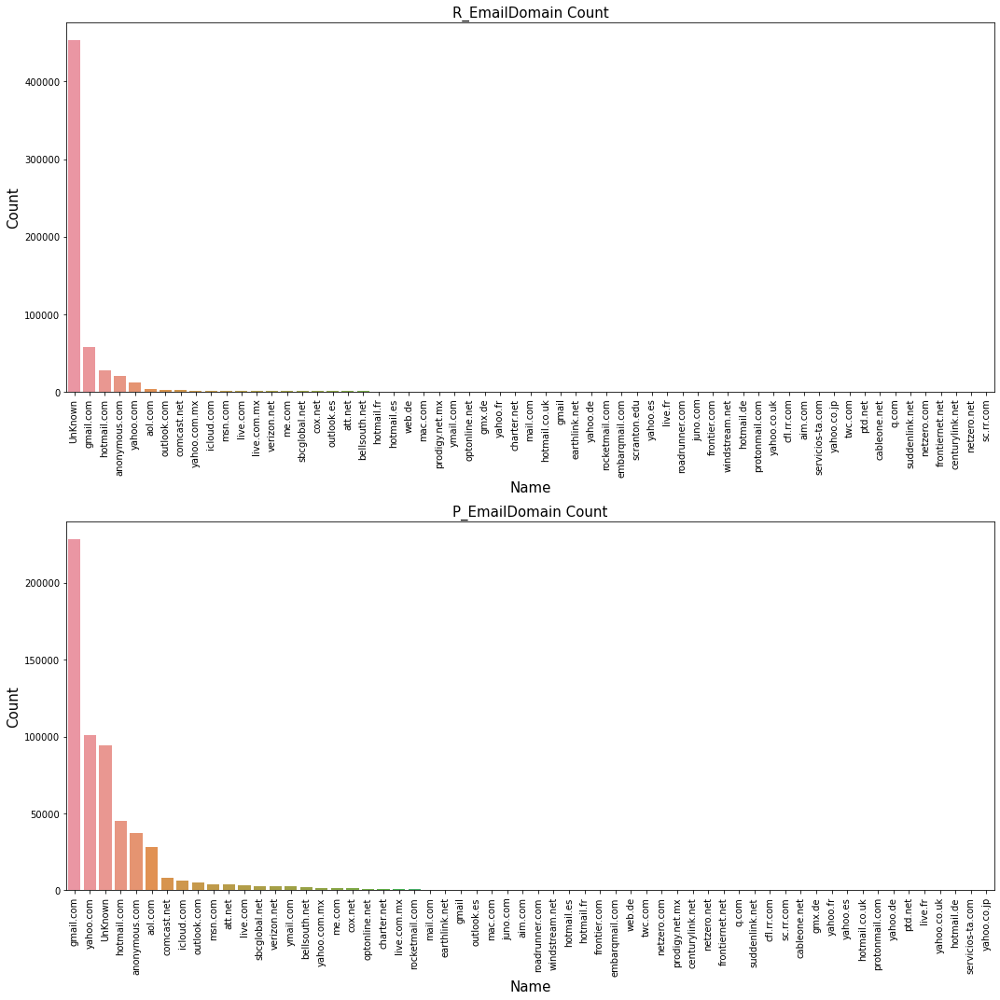

In [115]:
plt.figure(figsize = (15,15))

R_email = train["R_emaildomain"].value_counts().reset_index()
R_email.columns = ["Name", "Count"]
R_email = R_email.sort_values(by = "Count", ascending = False)

P_email = train["P_emaildomain"].value_counts().reset_index()
P_email.columns = ["Name", "Count"]
P_email = P_email.sort_values(by = "Count", ascending = False)

size = 15

plt.subplot(2,1,1) 

sns.barplot(x = "Name", y = "Count", data = R_email)
plt.xticks(rotation = 90)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Count", fontsize = size)
plt.title("R_EmailDomain Count", fontsize = size)

plt.subplot(2,1,2) 

sns.barplot(x = "Name", y = "Count", data = P_email)
plt.xticks(rotation = 90)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Count", fontsize = size)
plt.title("P_EmailDomain Count", fontsize = size)

plt.tight_layout()
plt.show()

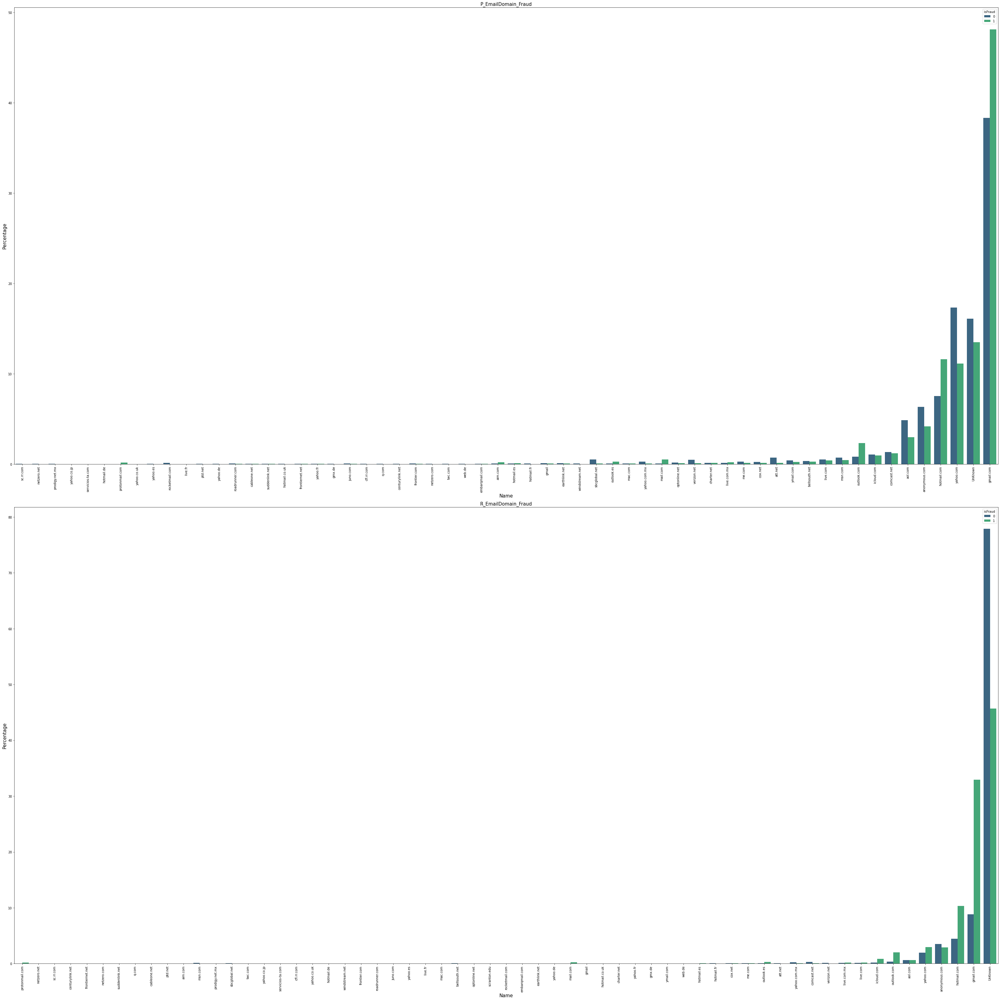

In [116]:
plt.figure(figsize = (45,45))


P_email_Fraud = (
    
    train.groupby("isFraud")["P_emaildomain"].value_counts(normalize = True).rename("percantage").
    mul(100).reset_index().sort_values("percantage")
)


E_email_Fraud = (
    
    train.groupby("isFraud")["R_emaildomain"].value_counts(normalize = True).rename("percantage").
    mul(100).reset_index().sort_values("percantage")
)


size = 15

plt.subplot(2,1,1) 

sns.barplot(x = "P_emaildomain", y = "percantage", data = P_email_Fraud,hue = "isFraud",
           palette="viridis")
plt.xticks(rotation = 90)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("P_EmailDomain_Fraud", fontsize = size)

plt.subplot(2,1,2) 

sns.barplot(x = "R_emaildomain", y = "percantage", data = E_email_Fraud, hue = "isFraud",
           palette="viridis")
plt.xticks(rotation = 90)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("R_EmailDomain_Fraud", fontsize = size)

plt.tight_layout()
plt.show()

In [117]:
train["P_emaildomain"].unique()

array(['UnKnown', 'gmail.com', 'outlook.com', 'yahoo.com', 'mail.com',
       'anonymous.com', 'hotmail.com', 'verizon.net', 'aol.com', 'me.com',
       'comcast.net', 'optonline.net', 'cox.net', 'charter.net',
       'rocketmail.com', 'prodigy.net.mx', 'embarqmail.com', 'icloud.com',
       'live.com.mx', 'gmail', 'live.com', 'att.net', 'juno.com',
       'ymail.com', 'sbcglobal.net', 'bellsouth.net', 'msn.com', 'q.com',
       'yahoo.com.mx', 'centurylink.net', 'servicios-ta.com',
       'earthlink.net', 'hotmail.es', 'cfl.rr.com', 'roadrunner.com',
       'netzero.net', 'gmx.de', 'suddenlink.net', 'frontiernet.net',
       'windstream.net', 'frontier.com', 'outlook.es', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'yahoo.fr', 'yahoo.de', 'yahoo.es', 'sc.rr.com', 'ptd.net',
       'live.fr', 'yahoo.co.uk', 'hotmail.fr', 'hotmail.de',
       'hotmail.co.uk', 'protonmail.com', 'yahoo.co.jp'], dtype=object)

In [118]:
gc.collect()

45757

In [119]:
train[train["P_emaildomain"].str.contains("mac")]["P_emaildomain"].unique()

array(['mac.com'], dtype=object)

In [120]:
train.loc[:,"P_emaildomain"] = np.where(train["P_emaildomain"].isin(["gmail.com","gmail"]), 
                                        "Google", train["P_emaildomain"])

train.loc[:,"P_emaildomain"] = np.where(train["P_emaildomain"].isin(['yahoo.com', 'yahoo.com.mx',
                                                                     'yahoo.fr', 'yahoo.de', 
                                                                     'yahoo.es','yahoo.co.uk', 
                                                                     'yahoo.co.jp']), "Yahoo",
                                                                      train["P_emaildomain"])

train.loc[:,"P_emaildomain"] = np.where(train["P_emaildomain"].isin(['hotmail.com', 'hotmail.es', 
                                                                      'hotmail.fr', 'hotmail.de',
                                                                      'hotmail.co.uk','live.com.mx', 
                                                                      'live.com', 'live.fr','msn.com',
                                                                      'outlook.com', 'outlook.es']), 
                                                                      "Hotmail",train["P_emaildomain"])

train.loc[:,"P_emaildomain"] = np.where(train["P_emaildomain"].isin(['mac.com','icloud.com','me.com']),
                                                                   "Apple",train["P_emaildomain"])

less_500 = pd.DataFrame(train["P_emaildomain"].value_counts()).reset_index()
less_500.columns = ["Name","Count"]

list_500 = less_500[less_500["Count"] < 500]["Name"].values.tolist()

train.loc[:,"P_emaildomain"] = np.where(train["P_emaildomain"].isin(list_500), 
                                        "Others", train["P_emaildomain"])

In [121]:
test.loc[:,"P_emaildomain"] = np.where(test["P_emaildomain"].isin(["gmail.com","gmail"]), 
                                        "Google", test["P_emaildomain"])

test.loc[:,"P_emaildomain"] = np.where(test["P_emaildomain"].isin(['yahoo.com', 'yahoo.com.mx',
                                                                     'yahoo.fr', 'yahoo.de', 
                                                                     'yahoo.es','yahoo.co.uk', 
                                                                     'yahoo.co.jp']), "Yahoo",
                                                                      test["P_emaildomain"])

test.loc[:,"P_emaildomain"] = np.where(test["P_emaildomain"].isin(['hotmail.com', 'hotmail.es', 
                                                                      'hotmail.fr', 'hotmail.de',
                                                                      'hotmail.co.uk','live.com.mx', 
                                                                      'live.com', 'live.fr','msn.com',
                                                                      'outlook.com', 'outlook.es']), 
                                                                      "Hotmail",test["P_emaildomain"])

test.loc[:,"P_emaildomain"] = np.where(test["P_emaildomain"].isin(['mac.com','icloud.com','me.com']),
                                                                   "Apple",test["P_emaildomain"])

less_500 = pd.DataFrame(test["P_emaildomain"].value_counts()).reset_index()
less_500.columns = ["Name","Count"]

list_500 = less_500[less_500["Count"] < 500]["Name"].values.tolist()

test.loc[:,"P_emaildomain"] = np.where(test["P_emaildomain"].isin(list_500), 
                                        "Others", test["P_emaildomain"])

In [122]:
train.loc[:,"R_emaildomain"] = np.where(train["R_emaildomain"].isin(["gmail.com","gmail"]), 
                                        "Google", train["R_emaildomain"])

train.loc[:,"R_emaildomain"] = np.where(train["R_emaildomain"].isin(['yahoo.com', 'yahoo.com.mx',
                                                                     'yahoo.fr', 'yahoo.de', 
                                                                     'yahoo.es','yahoo.co.uk', 
                                                                     'yahoo.co.jp']), "Yahoo",
                                                                      train["R_emaildomain"])

train.loc[:,"R_emaildomain"] = np.where(train["R_emaildomain"].isin(['hotmail.com', 'hotmail.es', 
                                                                      'hotmail.fr', 'hotmail.de',
                                                                      'hotmail.co.uk','live.com.mx', 
                                                                      'live.com', 'live.fr','msn.com',
                                                                      'outlook.com', 'outlook.es']), 
                                                                      "Hotmail",train["R_emaildomain"])

train.loc[:,"R_emaildomain"] = np.where(train["R_emaildomain"].isin(['mac.com','icloud.com','me.com']),
                                                                   "Apple",train["R_emaildomain"])

less_500 = pd.DataFrame(train["R_emaildomain"].value_counts()).reset_index()
less_500.columns = ["Name","Count"]

list_500 = less_500[less_500["Count"] < 500]["Name"].values.tolist()

train.loc[:,"R_emaildomain"] = np.where(train["R_emaildomain"].isin(list_500), 
                                        "Others", train["R_emaildomain"])

In [123]:
test.loc[:,"R_emaildomain"] = np.where(test["R_emaildomain"].isin(["gmail.com","gmail"]), 
                                        "Google", test["R_emaildomain"])

test.loc[:,"R_emaildomain"] = np.where(test["R_emaildomain"].isin(['yahoo.com', 'yahoo.com.mx',
                                                                     'yahoo.fr', 'yahoo.de', 
                                                                     'yahoo.es','yahoo.co.uk', 
                                                                     'yahoo.co.jp']), "Yahoo",
                                                                      test["R_emaildomain"])

test.loc[:,"R_emaildomain"] = np.where(test["R_emaildomain"].isin(['hotmail.com', 'hotmail.es', 
                                                                      'hotmail.fr', 'hotmail.de',
                                                                      'hotmail.co.uk','live.com.mx', 
                                                                      'live.com', 'live.fr','msn.com',
                                                                      'outlook.com', 'outlook.es']), 
                                                                      "Hotmail",test["R_emaildomain"])

test.loc[:,"R_emaildomain"] = np.where(test["R_emaildomain"].isin(['mac.com','icloud.com','me.com']),
                                                                   "Apple",test["R_emaildomain"])

less_500 = pd.DataFrame(test["R_emaildomain"].value_counts()).reset_index()
less_500.columns = ["Name","Count"]

list_500 = less_500[less_500["Count"] < 500]["Name"].values.tolist()

test.loc[:,"R_emaildomain"] = np.where(test["R_emaildomain"].isin(list_500), 
                                        "Others", test["R_emaildomain"])

In [124]:
test["R_emaildomain"].unique()

array(['UnKnown', 'Hotmail', 'Google', 'anonymous.com', 'Others', 'Yahoo',
       'aol.com', 'Apple', 'verizon.net', 'sbcglobal.net', 'comcast.net'],
      dtype=object)

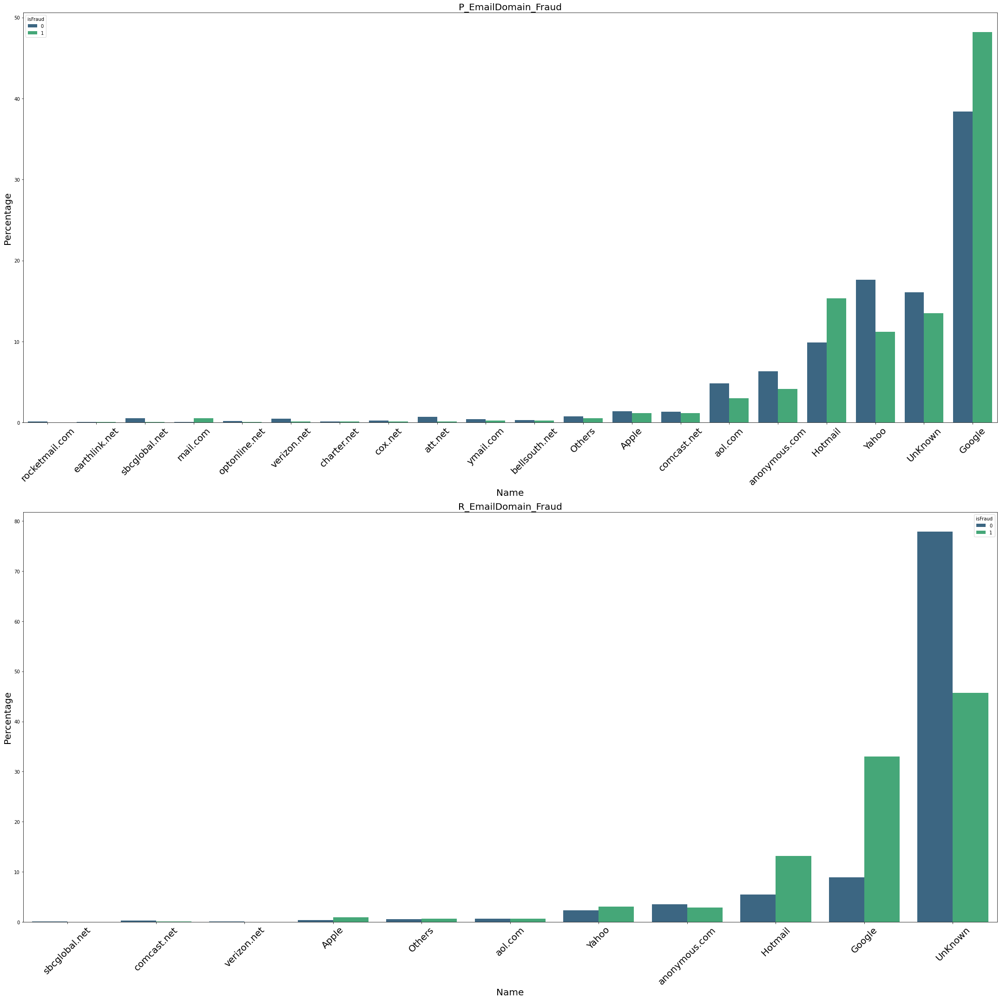

In [126]:
plt.figure(figsize = (30,30))


P_email_Fraud = (
    
    train.groupby("isFraud")["P_emaildomain"].value_counts(normalize = True).rename("percantage").
    mul(100).reset_index().sort_values("percantage")
)


E_email_Fraud = (
    
    train.groupby("isFraud")["R_emaildomain"].value_counts(normalize = True).rename("percantage").
    mul(100).reset_index().sort_values("percantage")
)


size = 20

plt.subplot(2,1,1) 

sns.barplot(x = "P_emaildomain", y = "percantage", data = P_email_Fraud,hue = "isFraud",palette="viridis")
plt.xticks(fontsize = size,rotation = 45)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("P_EmailDomain_Fraud", fontsize = size)

plt.subplot(2,1,2) 

sns.barplot(x = "R_emaildomain", y = "percantage", data = E_email_Fraud, hue = "isFraud",palette="viridis")
plt.xticks(fontsize = size,rotation = 45)
plt.xlabel("Name", fontsize = size)
plt.ylabel("Percentage", fontsize = size)
plt.title("R_EmailDomain_Fraud", fontsize = size)

plt.tight_layout()
plt.show()

In [127]:
gc.collect()

29546

## C1-C14

In [128]:
train.loc[:, train.columns.str.contains("C")].head(3)

,ProductCD,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,Risk_ProductCD
0,W,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,2.0000,0.0000,1.0000,1.0000,MiddleRiskProductCD
1,W,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,1.0000,MiddleRiskProductCD
2,W,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,1.0000,MiddleRiskProductCD


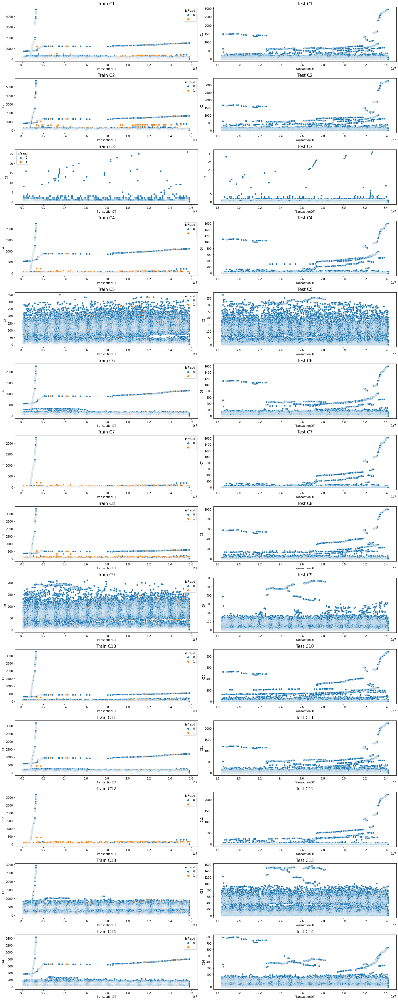

In [111]:
plt.figure(figsize = (20,50))

data_C = ["C"+str(i) for i in range(1,15)]
i = 1
size = 15

for col in data_C:
    
    plt.subplot(14,2,i)
    sns.scatterplot( x = "TransactionDT", y = col, hue = "isFraud",data = train[~(train[col].isnull())] )
    plt.title(f"Train {col.upper()}", fontsize = size)
    
    i+=1
    
    plt.subplot(14,2,i)
    
    sns.scatterplot( x = "TransactionDT", y = col, data = test[~(test[col].isnull())] )
    plt.title(f"Test {col.upper()}", fontsize = size)
    
    i+=1
    
plt.tight_layout()
plt.show()

In [129]:
train = train[~(train["C1"] > 3000)]
train = train[~(train["C2"] > 3000)]
train = train[~(train["C4"] > 1400)]
train = train[~(train["C6"] > 1400)]
train = train[~(train["C7"] > 1400)]
train = train[~(train["C8"] > 2000)]
train = train[~(train["C10"] > 2100)]
train = train[~(train["C11"] > 2000)]
train = train[~(train["C12"] > 2000)]
train = train[~(train["C13"] > 1950)]
train = train[~(train["C14"] > 900)]

In [131]:
data_C = ["C"+str(i) for i in range(1,15)]

for c in data_C:
    print(f"{c} Train için {train[c].isnull().sum()} değer boştur !!!")
    print(f"{c} Test için {test[c].isnull().sum()} değer boştur !!!",end = "\n\n")

C1 Train için 0 değer boştur !!!
C1 Test için 3 değer boştur !!!

C2 Train için 0 değer boştur !!!
C2 Test için 3 değer boştur !!!

C3 Train için 0 değer boştur !!!
C3 Test için 3 değer boştur !!!

C4 Train için 0 değer boştur !!!
C4 Test için 3 değer boştur !!!

C5 Train için 0 değer boştur !!!
C5 Test için 3 değer boştur !!!

C6 Train için 0 değer boştur !!!
C6 Test için 3 değer boştur !!!

C7 Train için 0 değer boştur !!!
C7 Test için 3 değer boştur !!!

C8 Train için 0 değer boştur !!!
C8 Test için 3 değer boştur !!!

C9 Train için 0 değer boştur !!!
C9 Test için 3 değer boştur !!!

C10 Train için 0 değer boştur !!!
C10 Test için 3 değer boştur !!!

C11 Train için 0 değer boştur !!!
C11 Test için 3 değer boştur !!!

C12 Train için 0 değer boştur !!!
C12 Test için 3 değer boştur !!!

C13 Train için 0 değer boştur !!!
C13 Test için 4748 değer boştur !!!

C14 Train için 0 değer boştur !!!
C14 Test için 3 değer boştur !!!



## D1-D15

In [132]:
data_D = ["D"+str(i) for i in range(1,16)]

In [133]:
for d in data_D:
    print(f"{d} Train için %{train[d].isnull().sum() / train.shape[0] * 100} değer boştur !!!")
    print(f"{d} Test için %{test[d].isnull().sum() / train.shape[0] * 100} değer boştur !!!",end = "\n\n")

D1 Train için %0.2150770904764407 değer boştur !!!
D1 Test için %1.0221670076149831 değer boştur !!!

D2 Train için %47.5286472854356 değer boştur !!!
D2 Test için %39.78993968011308 değer boştur !!!

D3 Train için %44.501975353419624 değer boştur !!!
D3 Test için %34.42962199650521 değer boştur !!!

D4 Train için %28.628303060399546 değer boştur !!!
D4 Test için %13.025129614030687 değer boştur !!!

D5 Train için %52.468810432171054 değer boştur !!!
D5 Test için %38.02830746702236 değer boştur !!!

D6 Train için %87.68009952188143 değer boştur !!!
D6 Test için %64.72786561834239 değer boştur !!!

D7 Train için %93.44599598997324 değer boştur !!!
D7 Test için %75.68510273363151 değer boştur !!!

D8 Train için %87.34078956511718 değer boştur !!!
D8 Test için %73.27756130713992 değer boştur !!!

D9 Train için %87.34078956511718 değer boştur !!!
D9 Test için %73.27756130713992 değer boştur !!!

D10 Train için %12.798866481023557 değer boştur !!!
D10 Test için %2.1261955082954676 değer boş

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


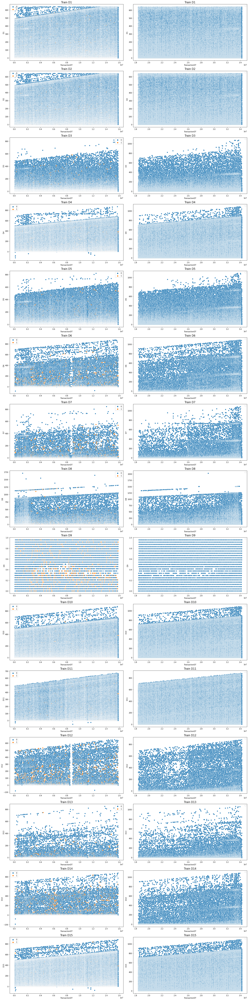

In [120]:
fig, axes = plt.subplots(15,2,figsize = (20,80))
size = 15
i=0

for col in data_D:
    
    sns.scatterplot(x = "TransactionDT", y = col, hue = "isFraud", 
                    data = train[~(train[col].isnull())] ,ax = axes[i][0])
    
    axes[i][0].set_title(f"Train {col.upper()}",fontsize = size)
    #axes[i][0].legend(loc = "best")
    
    sns.scatterplot(x = "TransactionDT", y = col , 
                    data = test[~(test[col].isnull())] ,ax = axes[i][1])
    
    axes[i][1].set_title(f"Train {col.upper()}",fontsize = size)
    #axes[i][1].legend(loc = "best")
    
    i+=1
    
plt.tight_layout()
plt.show()

- D1-15 : Önceki Işlem Arasındaki Günler Vb. Gibi Zaman Deltası
- Burda TransactionDT arttığında D özelliğinin arttığını gözlemlemekteyiz...
- Herhangi bir aykırı bir değer var varsa da görmezden gelenebilir ...
- Her biri için ( D1-15) %40 fazla eksik değer vardır..

In [134]:
gc.collect()

20

## M1 - M9

- Karttaki isimler ve Adres vb. Gibi Eşleme

In [135]:
data_M = ["M"+str(i) for i in range(1,10)]

for m in data_M:
    print(f"{m} Train için % {(train[m].isnull().sum() / len(train )*100)}")
    print(f"{m} Test için % {(test[m].isnull().sum() / len(test)) *100}",end= "\n\n")

M1 Train için % 45.86141849188419
M1 Test için % 34.861286267172694

M2 Train için % 45.86141849188419
M2 Test için % 34.861286267172694

M3 Train için % 45.86141849188419
M3 Test için % 34.861286267172694

M4 Train için % 47.69982763325373
M4 Test için % 46.92110181550491

M5 Train için % 59.31483794644598
M5 Test için % 61.10864412432824

M6 Train için % 28.6179644453333
M6 Test için % 31.36803298262649

M7 Train için % 58.60045659391785
M7 Test için % 46.38290397895364

M8 Train için % 58.598253282510285
M8 Test için % 46.38014095375683

M9 Train için % 58.598253282510285
M9 Test için % 46.38014095375683



In [136]:
train[data_M].head(3)

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M2,F,T,NaN,NaN,NaN
1,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2,T,T,T,M0,F,F,F,F,F


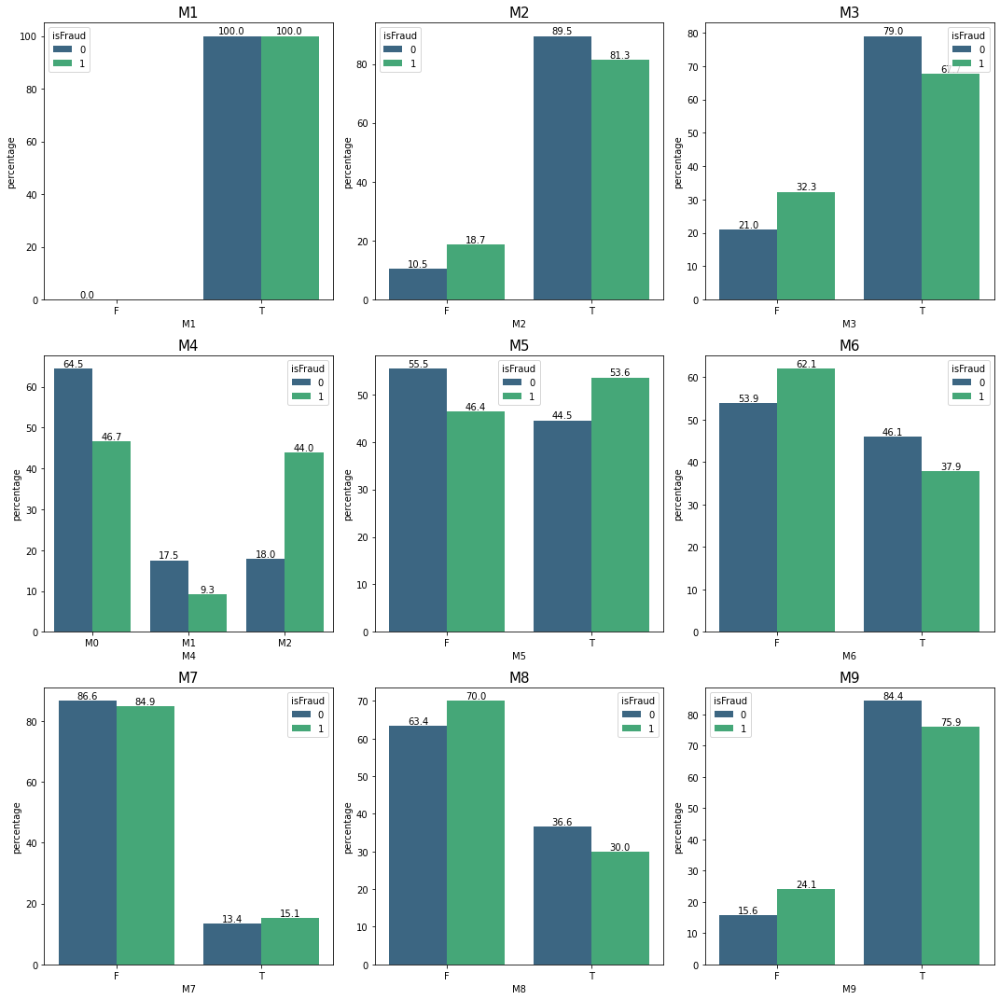

In [137]:
plt.figure(figsize = (15,15))
i = 1

for m in data_M:
    
    m_train = train.groupby("isFraud")[m].value_counts(normalize = True).rename("percentage").mul(100).\
              reset_index().sort_values(m)
    
    plt.subplot(3,3,i)
    m_bar = sns.barplot(x = m , y = "percentage", data = m_train, palette = "viridis", hue = "isFraud")
    plt.title(f"{m.upper()}",fontsize = 15)
    
    for p in m_bar.patches:
        m_bar.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    
    i+=1
    
plt.tight_layout()
plt.show()

## V Features

- Vesta, sıralama, sayma ve diğer varlık ilişkileri dahil olmak üzere zengin özellikler tasarladı.

In [138]:
gc.collect()

76

In [139]:
data_V = ["V" + str(i) for i in range(1,340) if i != 107]
data_V.append("TransactionDT")

#plt.figure(figsize = (15,15))
#sns.heatmap(train[data_V].corr(), cmap = "viridis", annot = False, center = 0.0)
#plt.title("V1-V339", fontsize = size)
#plt.show()

In [140]:
gc.collect()

40

## id01-id38

In [141]:
data_ID = train.loc[:,train.columns.str.contains("id")].columns.tolist()

for ID in data_ID:
    
    if train[ID].dtype == "object":
        
        print(f"{ID} : {train[ID].unique()}")    

id_12 : [nan 'NotFound' 'Found']
id_15 : [nan 'New' 'Found' 'Unknown']
id_16 : [nan 'NotFound' 'Found']
id_23 : [nan 'IP_PROXY:TRANSPARENT' 'IP_PROXY:ANONYMOUS' 'IP_PROXY:HIDDEN']
id_27 : [nan 'Found' 'NotFound']
id_28 : [nan 'New' 'Found']
id_29 : [nan 'NotFound' 'Found']
id_30 : [nan 'Android 7.0' 'iOS 11.1.2' 'Mac OS X 10_11_6' 'Windows 10' 'Android'
 'Linux' 'iOS 11.0.3' 'Mac OS X 10_7_5' 'Mac OS X 10_12_6'
 'Mac OS X 10_13_1' 'iOS 11.1.0' 'Mac OS X 10_9_5' 'Windows 7'
 'Windows 8.1' 'Mac' 'iOS 10.3.3' 'Mac OS X 10.12' 'Mac OS X 10_10_5'
 'Mac OS X 10_11_5' 'iOS 9.3.5' 'Android 5.1.1' 'Android 7.1.1'
 'Android 6.0' 'iOS 10.3.1' 'Mac OS X 10.9' 'iOS 11.1.1' 'Windows Vista'
 'iOS 10.3.2' 'iOS 11.0.2' 'Mac OS X 10.11' 'Android 8.0.0' 'iOS 10.2.0'
 'iOS 10.2.1' 'iOS 11.0.0' 'Mac OS X 10.10' 'Mac OS X 10_12_3'
 'Mac OS X 10_12' 'Android 6.0.1' 'iOS' 'Mac OS X 10.13'
 'Mac OS X 10_12_5' 'Mac OS X 10_8_5' 'iOS 11.0.1' 'iOS 10.0.2'
 'Android 5.0.2' 'Windows XP' 'iOS 11.2.0' 'Mac OS X 10.6'

In [142]:
train["id_30"].fillna("UnKnown", inplace = True)
test["id-30"].fillna("UnKnown",inplace = True)

train["OS_id_30"] = train["id_30"].replace("[\d\s\_.]", "", regex=True)
train["Version_id_30"] = train["id_30"].replace("[\_]", ".", 
                                                regex = True).replace("[A-z]","",regex = True)

test["OS_id_30"] = test["id-30"].replace("[\d\s\_.]", "", regex=True)
test["Version_id_30"] = test["id-30"].replace("[\_]", ".", 
                                                regex = True).replace("[A-z]","",regex = True)

train["Version_id_30"] = train["Version_id_30"].replace("","No.Version")
test["Version_id_30"] = test["Version_id_30"].replace("", "No.Version")

In [143]:
test[["OS_id_30","id-30","Version_id_30"]].isnull().sum()

OS_id_30         0
id-30            0
Version_id_30    0
dtype: int64

In [144]:
train[["OS_id_30","id_30","Version_id_30"]].isnull().sum()

OS_id_30         0
id_30            0
Version_id_30    0
dtype: int64

In [145]:
train["id_31"].fillna("UnKnown", inplace = True)
test["id-31"].fillna("UnKnown",inplace = True)

train["id_31"].replace("/",".",regex = True, inplace = True)
test["id-31"].replace("/",".",regex = True, inplace = True)

In [146]:
train["Browser_id_31"] = train["id_31"].replace("[\d.-]","",regex = True)
test["Browser_id_31"] = test["id-31"].replace("[\d.-]","",regex = True)

train["Version_id_31"] = train["id_31"].replace("[A-z-]","",regex = True)
test["Version_id_31"] = test["id-31"].replace("[A-z-]","",regex = True)

In [147]:
train["Version_id_31"] = train["Version_id_31"].replace("","No.Version")
test["Version_id_31"] = test["Version_id_31"].replace("","No.Version")

In [148]:
train[["id_31","Version_id_31","Browser_id_31"]].isnull().sum()

id_31            0
Version_id_31    0
Browser_id_31    0
dtype: int64

In [149]:
test[["id-31","Version_id_31","Browser_id_31"]].isnull().sum()

id-31            0
Version_id_31    0
Browser_id_31    0
dtype: int64

In [150]:
train["id_33"].fillna("unknownxunknown",inplace = True)
test["id-33"].fillna("unknownxunknown",inplace = True)

train["Width_id_33"] = train["id_33"].str.split("x", expand = True)[0]
train["Height_id_33"] = train["id_33"].str.split("x", expand = True)[1]

test["Width_id_33"] = test["id-33"].str.split("x", expand = True)[0]
test["Height_id_33"] = test["id-33"].str.split("x", expand = True)[1]

In [151]:
train[["id_33","Width_id_33","Height_id_33"]].isnull().sum()

id_33           0
Width_id_33     0
Height_id_33    0
dtype: int64

In [152]:
test[["id-33","Width_id_33","Height_id_33"]].isnull().sum()

id-33           0
Width_id_33     0
Height_id_33    0
dtype: int64

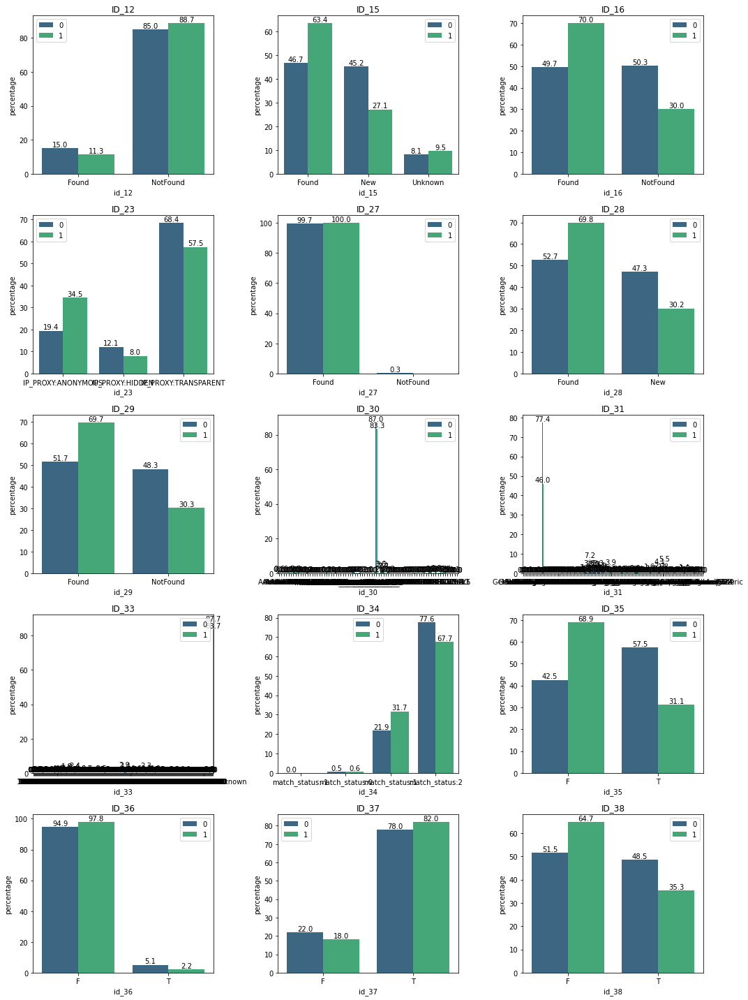

In [153]:
cat_ID = [col for col in data_ID if train[col].dtype == "object"]

i = 1

plt.figure(figsize = (15,20))

for col in cat_ID:
    
    plt.subplot(5,3,i)
    
    train_id = train.groupby("isFraud")[col].value_counts(normalize = True).rename("percentage").mul(100).\
               reset_index().sort_values(col)
    
    bar_id =sns.barplot(x = col , y = "percentage", data = train_id, hue = "isFraud",palette = "viridis")
    plt.title(f"{col.upper()}")
    plt.legend(loc = "best")
    #plt.xticks(rotation = 45)
    
    for p in bar_id.patches:
        bar_id.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    
    i+=1
    
plt.tight_layout()
plt.show()

## DeviceType and DeviceInfo

In [154]:
train[["DeviceType","DeviceInfo"]].head()

,DeviceType,DeviceInfo
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,mobile,SAMSUNG SM-G892A Build/NRD90M


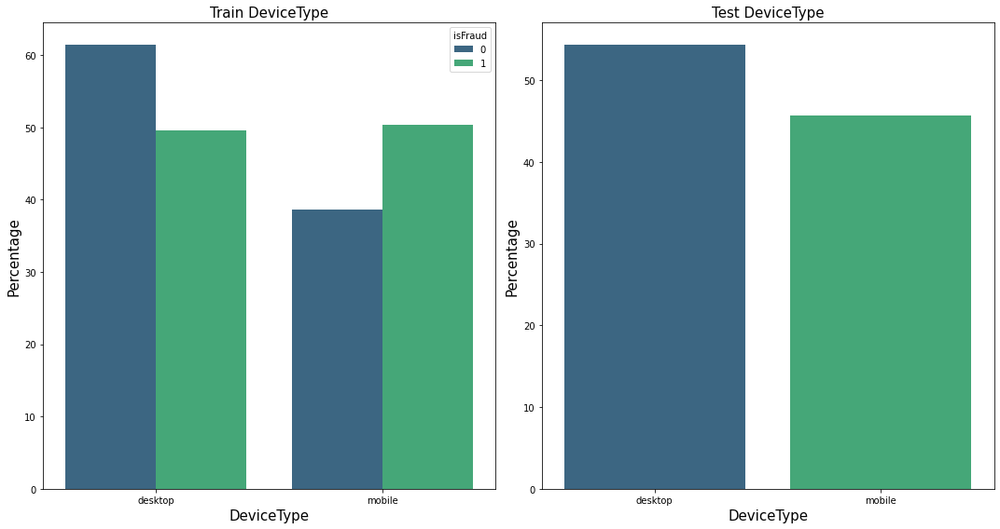

In [155]:
plt.figure(figsize = (15,8))
size = 15

plt.subplot(1,2,1)

train_type = (
    train[~(train["DeviceType"].isnull())].groupby("isFraud")["DeviceType"].value_counts(normalize = True)
    .rename("percentage").mul(100).reset_index().sort_values("DeviceType")
)

sns.barplot(x = "DeviceType", y = "percentage", data = train_type , hue="isFraud", palette = "viridis")
plt.xlabel("DeviceType", fontsize = size)
plt.ylabel("Percentage", fontsize = size )
plt.title("Train DeviceType" , fontsize = size)


plt.subplot(1,2,2)

test_type = (
    test[~(test["DeviceType"].isnull())][["DeviceType"]].value_counts(normalize = True).mul(100).
    rename("percentage").reset_index()
    
)

sns.barplot(x = "DeviceType", y = "percentage", data = test_type, palette = "viridis")
plt.xlabel("DeviceType", fontsize = size)
plt.ylabel("Percentage", fontsize = size )
plt.title("Test DeviceType" , fontsize = size)

plt.tight_layout()
plt.show()

In [156]:
# DeviceType
train["DeviceType"].fillna("UnKnown",inplace = True)
test["DeviceType"].fillna("UnKnown", inplace = True)

In [157]:
# DeviceInfo

train["DeviceInfo"].fillna("UnKnown",inplace = True)
test["DeviceInfo"].fillna("UnKnown",inplace = True)

In [158]:
print("DeviceInfo Nan Values Train : {}".format(train["DeviceInfo"].isnull().sum()))
print("DeviceInfo Nan Values Test  : {}".format(test["DeviceInfo"].isnull().sum()))

DeviceInfo Nan Values Train : 0
DeviceInfo Nan Values Test  : 0


In [159]:
train["DeviceInfo"].value_counts()

UnKnown                           471673
Windows                            47570
iOS Device                         19782
MacOS                              12573
Trident/7.0                         7429
                                   ...  
GT-S7582                               1
MAGNO                                  1
iPhone                                 1
C6603                                  1
SAMSUNG SM-J327AZ Build/NRD90M         1
Name: DeviceInfo, Length: 1785, dtype: int64

In [160]:
def device_transform(data):
    
    data["DeviceCorp"] = data["DeviceInfo"]
    
    #data.loc[:, "DeviceCorp"] = data["DeviceInfo"].str.split("/", expand= True)[0]
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("rv:",na = False) , 
                                         "RV" , data["DeviceCorp"])    
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("SM-",na = False) , 
                                         "SAMSUNG" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("SAMSUNG",na = False) , 
                                         "SAMSUNG" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("GT-",na = False) , 
                                         "SAMSUNG" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("HONOR",na = False) , 
                                         "HUAWEI" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("ALE-",na = False) , 
                                         "HUAWEI" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("-L",na = False) , 
                                         "HUAWEI" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("iOS",na = False) , 
                                         "APPLE" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("MacOS",na = False) , 
                                         "APPLE" , data["DeviceCorp"])

    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Idea",na = False) , 
                                         "LENOVO" , data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("TA",na = False) , 
                                         "LENOVO", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Moto",na = False) , 
                                         "MOTO", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("moto",na = False) , 
                                         "MOTO", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Moto G",na = False) , 
                                         "MOTO", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("XT",na = False) , 
                                         "MOTO", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Edison",na = False) , 
                                         "MOTO", data["DeviceCorp"])
        
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("MI",na = False) , 
                                         "XIAOMI", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Mi",na = False) , 
                                         "XIAOMI", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Redmi",na = False) , 
                                         "XIAOMI", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("VS",na = False) , 
                                         "LG", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("LG",na = False) , 
                                         "LG", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("EGO",na = False) , 
                                         "LG", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("ALCATEL",na = False) , 
                                         "ALCATEL", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("ONE TOUCH",na = False) , 
                                         "ALCATEL", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("ONE A",na = False) , 
                                         "ONEPLUS", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("OPR6",na = False) , 
                                         "HTC", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("HTC",na = False) , 
                                         "HTC", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Nexus",na = False) , 
                                         "GOOGLE", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Pixel",na = False) , 
                                         "GOOGLE", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("STV",na = False) , 
                                         "BLACKBERRY", data["DeviceCorp"])

    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("ASUS",na = False) , 
                                         "ASUS", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("BLADE",na = False) , 
                                         "ZTE", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.contains("Blade",na = False) , 
                                         "ZTE", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].isin(["rv","SM","GT","SGH"]),
                                         "SAMSUNG", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.startswith("Z",na = False), 
                                         "ZTE", data["DeviceCorp"])
    
    data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.startswith("KF",na = False), 
                                         "AMAZON", data["DeviceCorp"])    
    
    for i in ['D', 'E', 'F', 'G']:
    
        data.loc[:, "DeviceCorp"] = np.where(data["DeviceCorp"].str.startswith(i,na = False), 
                                         "SONY", data["DeviceCorp"]) 
    
    data["DeviceCorp"] = data["DeviceCorp"].str.upper()
    
    less_200 = pd.DataFrame(data["DeviceCorp"].value_counts()).reset_index()
    less_200.columns = ["Device" , "DeviceCorp"]
    less_200 = less_200[less_200["DeviceCorp"] < 200]["Device"].tolist()
    
    data.loc[: , "DeviceCorp"] = np.where(data["DeviceCorp"].isin(less_200), 
                                          "OTHERS" , data["DeviceCorp"])
    
    
    
    return data

In [161]:
train = device_transform(train)
test = device_transform(test)

In [162]:
train["DeviceCorp"].unique()

array(['UNKNOWN', 'SAMSUNG', 'APPLE', 'WINDOWS', 'ZTE', 'MOTO', 'XIAOMI',
       'OTHERS', 'RV', 'LG', 'TRIDENT/7.0', 'HUAWEI', 'SONY', 'AMAZON',
       'HTC', 'LENOVO'], dtype=object)

In [163]:
test["DeviceCorp"].unique()

array(['UNKNOWN', 'HUAWEI', 'LG', 'TRIDENT/7.0', 'SAMSUNG', 'APPLE',
       'WINDOWS', 'OTHERS', 'AMAZON', 'MOTO', 'XIAOMI', 'ZTE', 'RV',
       'LENOVO', 'SONY', 'HTC'], dtype=object)

In [164]:
print("DevicCorp Nan Values Train : {}".format(train["DeviceCorp"].isnull().sum()))
print("DeviceCorp Nan Values Test  : {}".format(test["DeviceCorp"].isnull().sum()))

DevicCorp Nan Values Train : 0
DeviceCorp Nan Values Test  : 0


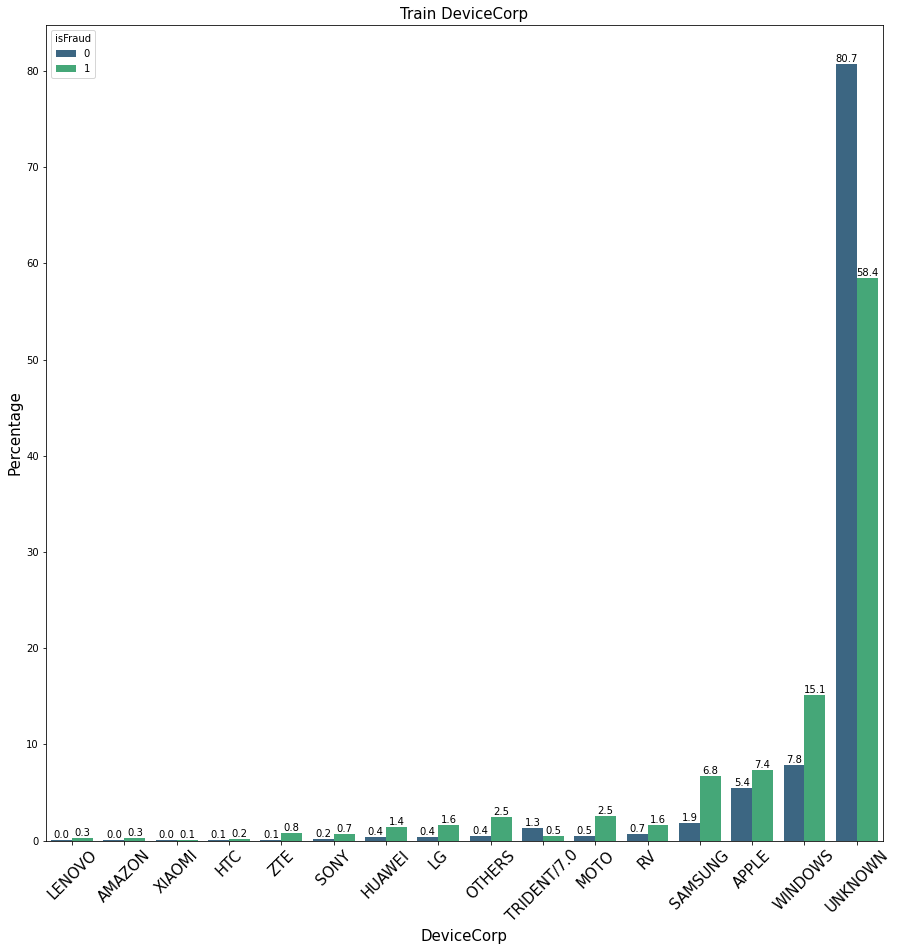

In [165]:

device_corp = train.groupby("isFraud")["DeviceCorp"].value_counts(normalize = True).mul(100).\
              rename("percentage").reset_index().sort_values("percentage")

plt.figure(figsize = (15,15))

corp_bar = sns.barplot(x = "DeviceCorp", y = "percentage", data = device_corp, hue = "isFraud", 
                       palette = "viridis")

for p in corp_bar.patches:
        corp_bar.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2.,p.get_height()), 
                     ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

size = 15
plt.title("Train DeviceCorp",fontsize = size)
plt.xlabel("DeviceCorp", fontsize = size)
plt.ylabel("Percentage",fontsize = size)
plt.xticks(rotation = 45, fontsize= size)
plt.show()

## Feature Enginerring

In [166]:
train["Trans_min_mean"] = train["TransactionAmt"] - train["TransactionAmt"].mean()
test["Trans_min_mean"] = test["TransactionAmt"] - test["TransactionAmt"].mean()

train["Trans_min_std"] = train["Trans_min_mean"] / train["TransactionAmt"].std()
test["Trans_min_std"] = test["Trans_min_mean"] / test["TransactionAmt"].std()


train["TransactionAmt_to_mean_card1"]= \
                    train["TransactionAmt"]  / train.groupby(["card1"])["TransactionAmt"].transform("mean")

train["TransactionAmt_to_mean_card4"]= \
                    train["TransactionAmt"]  / train.groupby(["card4"])["TransactionAmt"].transform("mean")

train["TransactionAmt_to_std_card1"]= \
                    train["TransactionAmt"]  / train.groupby(["card1"])["TransactionAmt"].transform("std")

train["TransactionAmt_to_std_card4"]= \
                    train["TransactionAmt"]  / train.groupby(["card4"])["TransactionAmt"].transform("std")

test["TransactionAmt_to_mean_card1"]= \
                    test["TransactionAmt"]  / test.groupby(["card1"])["TransactionAmt"].transform("mean")

test["TransactionAmt_to_mean_card4"]= \
                    test["TransactionAmt"]  / test.groupby(["card4"])["TransactionAmt"].transform("mean")

test["TransactionAmt_to_std_card1"]= \
                    test["TransactionAmt"]  / test.groupby(["card1"])["TransactionAmt"].transform("std")

test["TransactionAmt_to_std_card4"]= \
                    test["TransactionAmt"]  / test.groupby(["card4"])["TransactionAmt"].transform("std")

In [167]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,days,day_risk,hours,hours_risk,LogTransactionAmt,Risk_TransactionAmt,Risk_ProductCD,card3_feature,addr1_risk,Dist1_Risk,Dist2_Risk,OS_id_30,Version_id_30,Browser_id_31,Version_id_31,Width_id_33,Height_id_33,DeviceCorp,Trans_min_mean,Trans_min_std,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4
0,2987000,0,86400,68.5000,W,13926,NaN,150.0000,discover,142.0000,credit,315.0000,87.0000,19.0000,NaN,UnKnown,UnKnown,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,2.0000,0.0000,1.0000,1.0000,14.0000,NaN,13.0000,NaN,NaN,NaN,NaN,NaN,NaN,13.0000,13.0000,NaN,NaN,NaN,0.0000,T,T,T,M2,F,T,NaN,NaN,NaN,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,117.0000,0.0000,0.0000,0.0000,0.0000,0.0000,117.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [168]:
test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo,days,day_risk,hours,hours_risk,LogTransactionAmt,Risk_TransactionAmt,Risk_ProductCD,card3_feature,addr1_risk,Dist1_Risk,Dist2_Risk,OS_id_30,Version_id_30,Browser_id_31,Version_id_31,Width_id_33,Height_id_33,DeviceCorp,Trans_min_mean,Trans_min_std,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4
0,3663549,18403224,31.9500,W,10409,111.0000,150.0000,visa,226.0000,debit,170.0000,87.0000,1.0000,NaN,Google,UnKnown,6.0000,6.0000,0.0000,0.0000,3.0000,4.0000,0.0000,0.0000,6.0000,0.0000,5.0000,1.0000,115.0000,6.0000,419.0000,419.0000,27.0000,398.0000,27.0000,NaN,NaN,NaN,NaN,418.0000,203.0000,NaN,NaN,NaN,409.0000,T,T,F,NaN,NaN,F,T,T,T,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0000,47.9500,0.0000,0.0000,47.9500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [172]:
# Save Csv

train.to_csv("/Users/gokhanersoz/Desktop/GitHub/Fraud/Fraud_Data/train.csv")
test.to_csv("/Users/gokhanersoz/Desktop/GitHub/Fraud/Fraud_Data/test.csv")